In [ ]:
import tensorflow as tf
from tensorflow.keras import layers, models
from tensorflow.keras.preprocessing.image import ImageDataGenerator
from sklearn.model_selection import train_test_split
from sklearn.metrics import classification_report, roc_auc_score, roc_curve, confusion_matrix
import numpy as np
import os
import matplotlib.pyplot as plt

# Paths
image_folder = r"C:\Users\DELL.COM\Desktop\Ephraim files\My CTR Data\Preprocessed"
mask_folder = r"C:\Users\DELL.COM\Desktop\Ephraim files\Generated_Masks"
model_save_path = r"C:\Users\DELL.COM\Desktop\Ephraim files\CTR_UNet_Model.h5"

# Load images and masks
def load_data(image_folder, mask_folder):
    image_paths = sorted([os.path.join(image_folder, f) for f in os.listdir(image_folder) if f.endswith('.png')])
    mask_paths = sorted([os.path.join(mask_folder, f) for f in os.listdir(mask_folder) if f.endswith('.png')])
    
    images = [tf.keras.utils.load_img(path, target_size=(512, 512), color_mode="grayscale") for path in image_paths]
    masks = [tf.keras.utils.load_img(path, target_size=(512, 512), color_mode="grayscale") for path in mask_paths]
    
    images = np.array([np.array(img) / 255.0 for img in images])  # Normalize
    masks = np.array([np.array(mask) / 255.0 for mask in masks])  # Normalize to 0-1
    return images[..., np.newaxis], masks[..., np.newaxis]  # Add channel dimension

# Load data
images, masks = load_data(image_folder, mask_folder)

# Split data
X_train, X_test, y_train, y_test = train_test_split(images, masks, test_size=0.2, random_state=42)

# Data augmentation using ImageDataGenerator
datagen = ImageDataGenerator(
    rotation_range=15,       # Randomly rotate images by 15 degrees
    width_shift_range=0.1,   # Randomly shift images horizontally (10% of total width)
    height_shift_range=0.1,  # Randomly shift images vertically (10% of total height)
    shear_range=0.1,         # Shear angle in counter-clockwise direction
    zoom_range=0.2,          # Randomly zoom images
    horizontal_flip=True,    # Randomly flip images horizontally
    fill_mode="nearest"      # Fill any empty pixels with the nearest values
)

# Data generator for augmented images and masks
def data_generator(image_data, mask_data, batch_size):
    seed = 42
    image_gen = datagen.flow(image_data, batch_size=batch_size, seed=seed)
    mask_gen = datagen.flow(mask_data, batch_size=batch_size, seed=seed)
    while True:
        yield next(image_gen), next(mask_gen)

# Build U-Net model
def build_unet(input_shape):
    inputs = layers.Input(shape=input_shape)
    
    # Encoder
    c1 = layers.Conv2D(64, (3, 3), activation='relu', padding='same')(inputs)
    c1 = layers.Conv2D(64, (3, 3), activation='relu', padding='same')(c1)
    p1 = layers.MaxPooling2D((2, 2))(c1)
    
    c2 = layers.Conv2D(128, (3, 3), activation='relu', padding='same')(p1)
    c2 = layers.Conv2D(128, (3, 3), activation='relu', padding='same')(c2)
    p2 = layers.MaxPooling2D((2, 2))(c2)
    
    # Bottleneck
    c5 = layers.Conv2D(256, (3, 3), activation='relu', padding='same')(p2)
    c5 = layers.Conv2D(256, (3, 3), activation='relu', padding='same')(c5)
    
    # Decoder
    u6 = layers.Conv2DTranspose(128, (2, 2), strides=(2, 2), padding='same')(c5)
    u6 = layers.concatenate([u6, c2])  # Concatenate encoder and decoder features
    c6 = layers.Conv2D(128, (3, 3), activation='relu', padding='same')(u6)
    c6 = layers.Conv2D(128, (3, 3), activation='relu', padding='same')(c6)
    
    u7 = layers.Conv2DTranspose(64, (2, 2), strides=(2, 2), padding='same')(c6)
    u7 = layers.concatenate([u7, c1])  # Concatenate encoder and decoder features
    c7 = layers.Conv2D(64, (3, 3), activation='relu', padding='same')(u7)
    c7 = layers.Conv2D(64, (3, 3), activation='relu', padding='same')(c7)
    
    outputs = layers.Conv2D(1, (1, 1), activation='sigmoid')(c7)  # Single channel output
    model = models.Model(inputs, outputs)
    return model

# Compile model
model = build_unet((512, 512, 1))
model.compile(optimizer='adam', loss='binary_crossentropy', metrics=['accuracy'])

# Train the model with augmented data
batch_size = 8
steps_per_epoch = len(X_train) // batch_size

history = model.fit(
    data_generator(X_train, y_train, batch_size=batch_size),
    validation_data=(X_test, y_test),
    steps_per_epoch=steps_per_epoch,
    epochs=25
)

# Save the model
model.save(model_save_path)
print(f"Model saved to {model_save_path}")

# Evaluate model
y_pred = model.predict(X_test)

# Threshold masks
def threshold_mask(mask, threshold=0.5):
    return (mask > threshold).astype(int)

y_pred_thresh = np.array([threshold_mask(pred) for pred in y_pred])

# Flatten arrays for metric calculations
y_test_flat = y_test.flatten()
y_pred_flat = y_pred_thresh.flatten()

# Compute confusion matrix
cm = confusion_matrix(y_test_flat, y_pred_flat)
tn, fp, fn, tp = cm.ravel()

# Calculate metrics
sensitivity = tp / (tp + fn)  # Recall
specificity = tn / (tn + fp)
precision = tp / (tp + fp)
accuracy = (tp + tn) / (tp + tn + fp + fn)

# Compute ROC-AUC
roc_auc = roc_auc_score(y_test_flat, y_pred_flat)

# Display metrics
print("\nPerformance Metrics:")
print(f"Sensitivity (Recall): {sensitivity:.4f}")
print(f"Specificity: {specificity:.4f}")
print(f"Precision: {precision:.4f}")
print(f"Accuracy: {accuracy:.4f}")
print(f"ROC-AUC: {roc_auc:.4f}")

# Plot ROC Curve
fpr, tpr, thresholds = roc_curve(y_test_flat, y_pred_flat)
plt.figure(figsize=(8, 6))
plt.plot(fpr, tpr, label=f"ROC Curve (AUC = {roc_auc:.2f})", color='blue')
plt.plot([0, 1], [0, 1], linestyle='--', color='gray')
plt.xlabel("False Positive Rate")
plt.ylabel("True Positive Rate")
plt.title("Receiver Operating Characteristic (ROC) Curve")
plt.legend(loc="lower right")
plt.grid(alpha=0.3)
plt.show()


Epoch 1/25
75/75 ━━━━━━━━━━━━━━━━━━━━ 16548s 221s/step - accuracy: 0.5543 - loss: 0.6238 - val_accuracy: 0.6418 - val_loss: 0.5443
Epoch 2/25
75/75 ━━━━━━━━━━━━━━━━━━━━ 17162s 222s/step - accuracy: 0.6484 - loss: 0.5273 - val_accuracy: 0.6078 - val_loss: 0.5944
Epoch 3/25
75/75 ━━━━━━━━━━━━━━━━━━━━ 17591s 229s/step - accuracy: 0.6798 - loss: 0.4917 - val_accuracy: 0.6962 - val_loss: 0.4979
Epoch 4/25
75/75 ━━━━━━━━━━━━━━━━━━━━ 18370s 242s/step - accuracy: 0.6958 - loss: 0.4709 - val_accuracy: 0.7561 - val_loss: 0.3884
Epoch 5/25
75/75 ━━━━━━━━━━━━━━━━━━━━ 19412s 255s/step - accuracy: 0.7445 - loss: 0.4124 - val_accuracy: 0.7945 - val_loss: 0.3212
Epoch 6/25
75/75 ━━━━━━━━━━━━━━━━━━━━ 17341s 228s/step - accuracy: 0.7499 - loss: 0.3918 - val_accuracy: 0.7962 - val_loss: 0.3218
Epoch 7/25
75/75 ━━━━━━━━━━━━━━━━━━━━ 17561s 233s/step - accuracy: 0.7807 - loss: 0.3381 - val_accuracy: 0.8034 - val_loss: 0.3035
Epoch 8/25
75/75 ━━━━━━━━━━━━━━━━━━━━ 16504s 215s/step - accuracy: 0.7927 - loss: 0

KeyboardInterrupt: 

: 

In [9]:
import tensorflow as tf
from tensorflow.keras import layers, models
from tensorflow.keras.callbacks import ModelCheckpoint
from sklearn.model_selection import train_test_split
from sklearn.metrics import classification_report, roc_auc_score, roc_curve, confusion_matrix
import numpy as np
import os
import matplotlib.pyplot as plt

# Paths
image_folder = r"C:\Users\DELL.COM\Desktop\Ephraim files\My CTR Data\Preprocessed"
mask_folder = r"C:\Users\DELL.COM\Desktop\Ephraim files\Generated_Masks"
model_save_path = r"C:\Users\DELL.COM\Desktop\Ephraim files\CTR_UNet_Model.keras"

# Load images and masks
def load_data(image_folder, mask_folder):
    image_paths = sorted([os.path.join(image_folder, f) for f in os.listdir(image_folder) if f.endswith('.png')])
    mask_paths = sorted([os.path.join(mask_folder, f) for f in os.listdir(mask_folder) if f.endswith('.png')])
    
    images = [tf.keras.utils.load_img(path, target_size=(256, 256), color_mode="grayscale") for path in image_paths]
    masks = [tf.keras.utils.load_img(path, target_size=(256, 256), color_mode="grayscale") for path in mask_paths]
    
    images = np.array([np.array(img) / 255.0 for img in images])  # Normalize
    masks = np.array([np.array(mask) / 255.0 for mask in masks])  # Normalize to 0-1
    return images[..., np.newaxis], masks[..., np.newaxis]  # Add channel dimension

# Load data
images, masks = load_data(image_folder, mask_folder)

# Split data
X_train, X_test, y_train, y_test = train_test_split(images, masks, test_size=0.2, random_state=42)

import tensorflow as tf
from tensorflow.keras import layers, models

# Build U-Net model
def build_unet(input_shape):
    inputs = layers.Input(shape=input_shape)

    # Encoder
    c1 = layers.Conv2D(64, (3, 3), activation='relu', padding='same')(inputs)
    c1 = layers.Conv2D(64, (3, 3), activation='relu', padding='same')(c1)
    p1 = layers.MaxPooling2D((2, 2))(c1)

    c2 = layers.Conv2D(128, (3, 3), activation='relu', padding='same')(p1)
    c2 = layers.Conv2D(128, (3, 3), activation='relu', padding='same')(c2)
    p2 = layers.MaxPooling2D((2, 2))(c2)

    # Bottleneck
    c5 = layers.Conv2D(256, (3, 3), activation='relu', padding='same')(p2)
    c5 = layers.Conv2D(256, (3, 3), activation='relu', padding='same')(c5)

    # Decoder
    u6 = layers.Conv2DTranspose(128, (2, 2), strides=(2, 2), padding='same')(c5)
    c2_resized = layers.Resizing(height=u6.shape[1], width=u6.shape[2])(c2)  # Resize to match u6
    u6 = layers.concatenate([u6, c2_resized])
    c6 = layers.Conv2D(128, (3, 3), activation='relu', padding='same')(u6)
    c6 = layers.Conv2D(128, (3, 3), activation='relu', padding='same')(c6)

    u7 = layers.Conv2DTranspose(64, (2, 2), strides=(2, 2), padding='same')(c6)
    c1_resized = layers.Resizing(height=u7.shape[1], width=u7.shape[2])(c1)  # Resize to match u7
    u7 = layers.concatenate([u7, c1_resized])
    c7 = layers.Conv2D(64, (3, 3), activation='relu', padding='same')(u7)
    c7 = layers.Conv2D(64, (3, 3), activation='relu', padding='same')(c7)

    outputs = layers.Conv2D(1, (1, 1), activation='sigmoid')(c7)  # Single-channel output
    model = models.Model(inputs, outputs)
    return model

# Compile model
model = build_unet((256, 256, 1))
model.compile(optimizer='adam', loss='binary_crossentropy', metrics=['accuracy'])

# Print model summary to verify the structure
model.summary()


# Callback to save model after each epoch
checkpoint = tf.keras.callbacks.ModelCheckpoint(model_save_path, save_best_only=True, monitor='val_loss', mode='min')

# Train the model
batch_size = 8
history = model.fit(
    X_train, y_train,
    validation_data=(X_test, y_test),
    batch_size=batch_size,
    epochs=15,
    callbacks=[checkpoint]
)


# Evaluate model
y_pred = model.predict(X_test)

# Further evaluation and metrics calculation...


Model: "functional_1"

┏━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━┓
┃ Layer (type)        ┃ Output Shape      ┃    Param # ┃ Connected to      ┃
┡━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━┩
│ input_layer_8       │ (None, 256, 256,  │          0 │ -                 │
│ (InputLayer)        │ 1)                │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ conv2d_57 (Conv2D)  │ (None, 256, 256,  │        640 │ input_layer_8[0]… │
│                     │ 64)               │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ conv2d_58 (Conv2D)  │ (None, 256, 256,  │     36,928 │ conv2d_57[0][0]   │
│                     │ 64)               │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ max_pooling2d_16    │ (None, 128, 128,  │          0 │ conv2d_58[0][0]   │
│ (MaxPooling2D)      │ 64)               │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ conv2d_59 (Conv2D)  │ (None, 128, 128,  │     73,856 │ max_pooling2d_16… │
│                     │ 128)              │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ conv2d_60 (Conv2D)  │ (None, 128, 128,  │    147,584 │ conv2d_59[0][0]   │
│                     │ 128)              │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ max_pooling2d_17    │ (None, 64, 64,    │          0 │ conv2d_60[0][0]   │
│ (MaxPooling2D)      │ 128)              │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ conv2d_61 (Conv2D)  │ (None, 64, 64,    │    295,168 │ max_pooling2d_17… │
│                     │ 256)              │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ conv2d_62 (Conv2D)  │ (None, 64, 64,    │    590,080 │ conv2d_61[0][0]   │
│                     │ 256)              │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ conv2d_transpose_11 │ (None, 128, 128,  │    131,200 │ conv2d_62[0][0]   │
│ (Conv2DTranspose)   │ 128)              │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ resizing_2          │ (None, 128, 128,  │          0 │ conv2d_60[0][0]   │
│ (Resizing)          │ 128)              │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ concatenate_11      │ (None, 128, 128,  │          0 │ conv2d_transpose… │
│ (Concatenate)       │ 256)              │            │ resizing_2[0][0]  │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ conv2d_63 (Conv2D)  │ (None, 128, 128,  │    295,040 │ concatenate_11[0… │
│                     │ 128)              │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ conv2d_64 (Conv2D)  │ (None, 128, 128,  │    147,584 │ conv2d_63[0][0]   │
│                     │ 128)              │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ conv2d_transpose_12 │ (None, 256, 256,  │     32,832 │ conv2d_64[0][0]   │
│ (Conv2DTranspose)   │ 64)               │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ resizing_3          │ (None, 256, 256,  │          0 │ conv2d_58[0][0]   │
│ (Resizing)          │ 64)               │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ concatenate_12      │ (None, 256, 256,  │          0 │ conv2d_transpose

 Total params: 1,861,697 (7.10 MB)

 Trainable params: 1,861,697 (7.10 MB)

 Non-trainable params: 0 (0.00 B)

Epoch 1/15
76/76 ━━━━━━━━━━━━━━━━━━━━ 2445s 32s/step - accuracy: 0.5871 - loss: 0.6200 - val_accuracy: 0.6656 - val_loss: 0.5230
Epoch 2/15
76/76 ━━━━━━━━━━━━━━━━━━━━ 4465s 58s/step - accuracy: 0.6941 - loss: 0.4866 - val_accuracy: 0.7353 - val_loss: 0.3955
Epoch 3/15
76/76 ━━━━━━━━━━━━━━━━━━━━ 2397s 32s/step - accuracy: 0.7599 - loss: 0.3636 - val_accuracy: 0.7581 - val_loss: 0.3962
Epoch 4/15
76/76 ━━━━━━━━━━━━━━━━━━━━ 2397s 32s/step - accuracy: 0.7810 - loss: 0.3326 - val_accuracy: 0.7919 - val_loss: 0.3130
Epoch 5/15
76/76 ━━━━━━━━━━━━━━━━━━━━ 2431s 32s/step - accuracy: 0.8034 - loss: 0.2960 - val_accuracy: 0.8131 - val_loss: 0.2731
Epoch 6/15
76/76 ━━━━━━━━━━━━━━━━━━━━ 2400s 32s/step - accuracy: 0.8099 - loss: 0.2787 - val_accuracy: 0.8184 - val_loss: 0.2594
Epoch 7/15
76/76 ━━━━━━━━━━━━━━━━━━━━ 2846s 38s/step - accuracy: 0.8285 - loss: 0.2412 - val_accuracy: 0.8150 - val_loss: 0.2653
Epoch 8/15
76/76 ━━━━━━━━━━━━━━━━━━━━ 2471s 32s/step - accuracy: 0.8258 - loss: 0.2418 - val_accu

In [15]:
from sklearn.metrics import confusion_matrix, roc_auc_score, roc_curve
import matplotlib.pyplot as plt
import numpy as np

# Ensure predictions are binary by applying a threshold
y_pred_binary = (y_pred > 0.5).astype(int)  # Threshold predictions to 0 or 1

# Flatten predictions and ground truths for metric calculation
y_pred_flat = y_pred_binary.flatten()
y_test_flat = (y_test > 0.5).astype(int).flatten()  # Ensure ground truths are binary

# Compute confusion matrix
tn, fp, fn, tp = confusion_matrix(y_test_flat, y_pred_flat).ravel()

# Compute evaluation metrics
accuracy = (tp + tn) / (tp + tn + fp + fn)
precision = tp / (tp + fp) if (tp + fp) != 0 else 0
recall = tp / (tp + fn) if (tp + fn) != 0 else 0  # Sensitivity
specificity = tn / (tn + fp) if (tn + fp) != 0 else 0
f1_score = 2 * (precision * recall) / (precision + recall) if (precision + recall) != 0 else 0
roc_auc = roc_auc_score(y_test_flat, y_pred.flatten())  # Use continuous predictions for ROC AUC

# Compute test accuracy explicitly
test_accuracy = accuracy

# Print metrics
print("Evaluation Metrics:")
print(f"Test Accuracy: {test_accuracy:.4f}")
print(f"Precision: {precision:.4f}")
print(f"Recall (Sensitivity): {recall:.4f}")
print(f"Specificity: {specificity:.4f}")
print(f"F1 Score: {f1_score:.4f}")
print(f"ROC AUC: {roc_auc:.4f}")

# Plot ROC curve
fpr, tpr, thresholds = roc_curve(y_test_flat, y_pred.flatten())
plt.figure(figsize=(8, 6))
plt.plot(fpr, tpr, label=f'ROC Curve (AUC = {roc_auc:.4f})')
plt.plot([0, 1], [0, 1], 'k--', label='Random Classifier')
plt.xlabel('False Positive Rate')
plt.ylabel('True Positive Rate')
plt.title('Receiver Operating Characteristic (ROC) Curve')
plt.legend()
plt.grid()
plt.show()


NameError: name 'y_pred' is not defined

1/1 ━━━━━━━━━━━━━━━━━━━━ 6s 6s/step


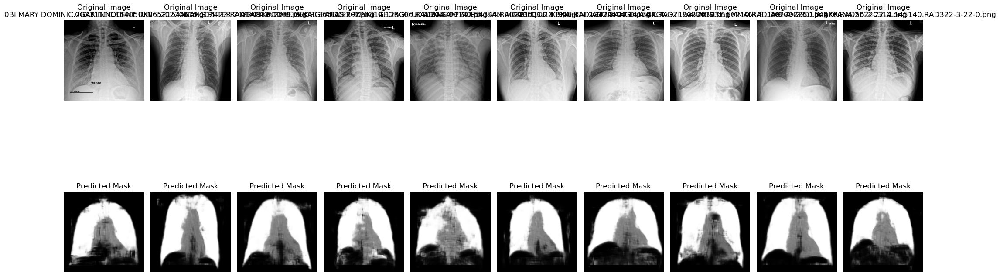

In [11]:
import tensorflow as tf
import numpy as np
import matplotlib.pyplot as plt
import os

# Paths
image_folder = r"C:\Users\DELL.COM\Desktop\Ephraim files\My CTR Data"
model_save_path = r"C:\Users\DELL.COM\Desktop\Ephraim files\CTR_UNet_Model.keras"

# Load the model
model = tf.keras.models.load_model(model_save_path)

# Function to preprocess images for testing
def preprocess_images(image_folder, target_size=(256, 256), num_images=10):
    image_paths = sorted([os.path.join(image_folder, f) for f in os.listdir(image_folder) if f.endswith('.png')])
    images = [tf.keras.utils.load_img(path, target_size=target_size, color_mode="grayscale") for path in image_paths[:num_images]]
    images = np.array([np.array(img) / 255.0 for img in images])  # Normalize
    return images[..., np.newaxis], image_paths[:num_images]  # Add channel dimension

# Preprocess the first 10 images
test_images, test_image_paths = preprocess_images(image_folder, num_images=10)

# Generate masks using the model
predicted_masks = model.predict(test_images)

# Display the images and their predicted masks
def display_images_and_masks(images, masks, image_paths, num_to_display=10):
    plt.figure(figsize=(20, 10))
    for i in range(num_to_display):
        # Original image
        plt.subplot(2, num_to_display, i + 1)
        plt.imshow(images[i, :, :, 0], cmap='gray')
        plt.title(f"Original Image\n{os.path.basename(image_paths[i])}")
        plt.axis('off')

        # Predicted mask
        plt.subplot(2, num_to_display, num_to_display + i + 1)
        plt.imshow(masks[i, :, :, 0], cmap='gray')
        plt.title("Predicted Mask")
        plt.axis('off')

    plt.tight_layout()
    plt.show()

# Display the first 10 images and their masks
display_images_and_masks(test_images, predicted_masks, test_image_paths)


In [33]:
import cv2
import os

# Define paths
input_folder = r"C:\Users\DELL.COM\Desktop\Ephraim files\My CTR Data"
output_folder = r"C:\Users\DELL.COM\Desktop\Ephraim files\My CTR Data\Preprocessed"

# Ensure the output folder exists
os.makedirs(output_folder, exist_ok=True)

# List all image files in the input folder
image_files = [f for f in os.listdir(input_folder) if f.lower().endswith(('.png', '.jpg', '.jpeg', '.bmp', '.tiff'))]

# Process images
for idx, image_file in enumerate(image_files):
    # Read the image
    image_path = os.path.join(input_folder, image_file)
    image = cv2.imread(image_path, cv2.IMREAD_COLOR)
    
    if image is None:
        print(f"Could not read {image_file}. Skipping...")
        continue
    
    # Resize the image to 514x514
    resized_image = cv2.resize(image, (514, 514))
    
    # Apply edge enhancement (using Laplacian filter for simplicity)
    laplacian = cv2.Laplacian(resized_image, cv2.CV_64F)
    edge_enhanced = cv2.convertScaleAbs(laplacian + resized_image)
    
    # Save the processed image with the new name
    output_name = f"p{idx + 1}.png"
    output_path = os.path.join(output_folder, output_name)
    cv2.imwrite(output_path, edge_enhanced)

    print(f"Processed and saved: {output_path}")

print("Processing complete!")


Processed and saved: C:\Users\DELL.COM\Desktop\Ephraim files\My CTR Data\Preprocessed\p1.png
Processed and saved: C:\Users\DELL.COM\Desktop\Ephraim files\My CTR Data\Preprocessed\p2.png
Processed and saved: C:\Users\DELL.COM\Desktop\Ephraim files\My CTR Data\Preprocessed\p3.png
Processed and saved: C:\Users\DELL.COM\Desktop\Ephraim files\My CTR Data\Preprocessed\p4.png
Processed and saved: C:\Users\DELL.COM\Desktop\Ephraim files\My CTR Data\Preprocessed\p5.png
Processed and saved: C:\Users\DELL.COM\Desktop\Ephraim files\My CTR Data\Preprocessed\p6.png
Processed and saved: C:\Users\DELL.COM\Desktop\Ephraim files\My CTR Data\Preprocessed\p7.png
Processed and saved: C:\Users\DELL.COM\Desktop\Ephraim files\My CTR Data\Preprocessed\p8.png
Processed and saved: C:\Users\DELL.COM\Desktop\Ephraim files\My CTR Data\Preprocessed\p9.png
Processed and saved: C:\Users\DELL.COM\Desktop\Ephraim files\My CTR Data\Preprocessed\p10.png
Processed and saved: C:\Users\DELL.COM\Desktop\Ephraim files\My CTR D

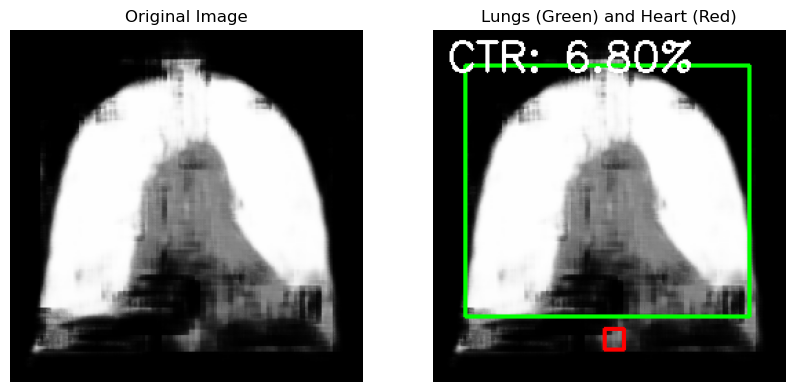

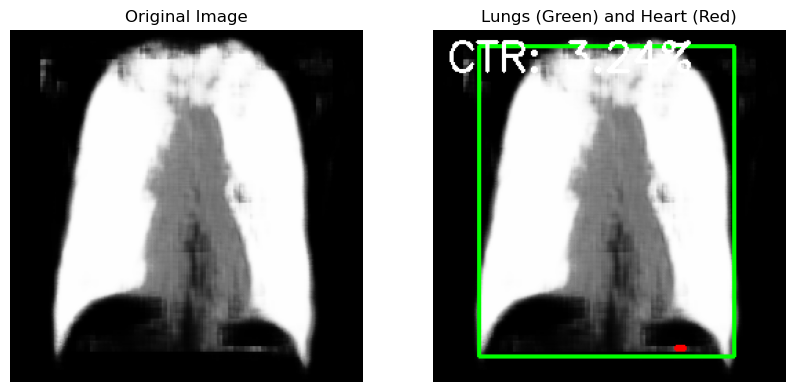

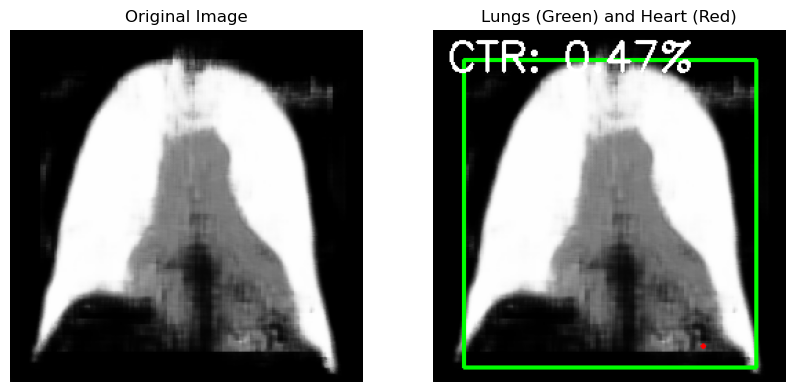

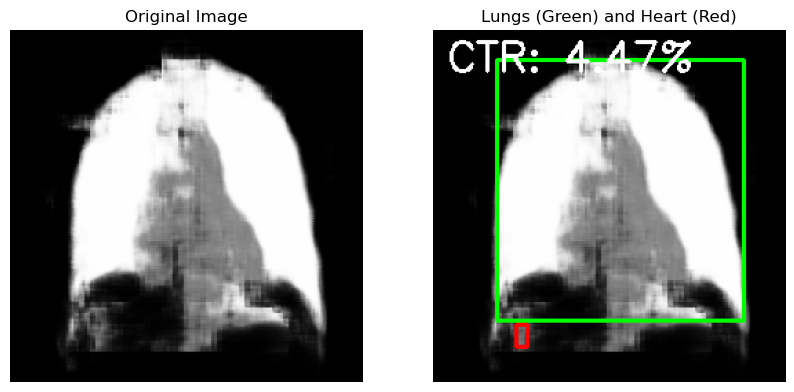

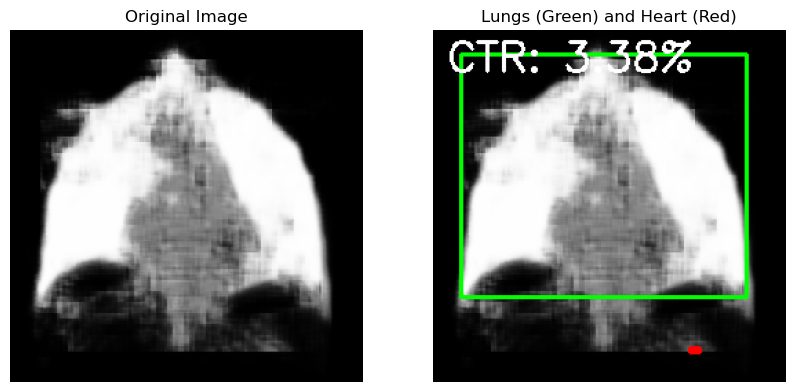

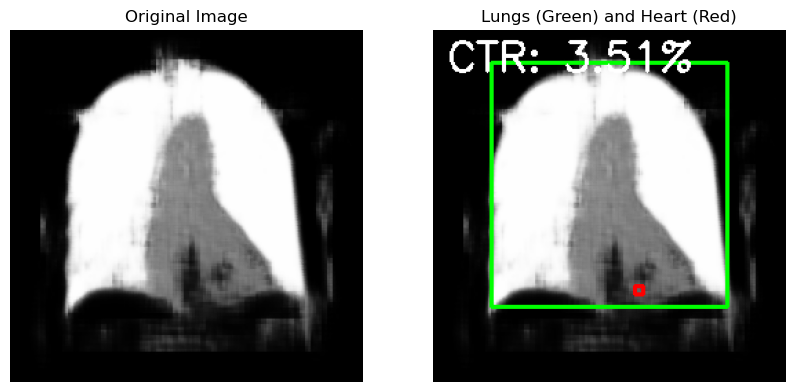

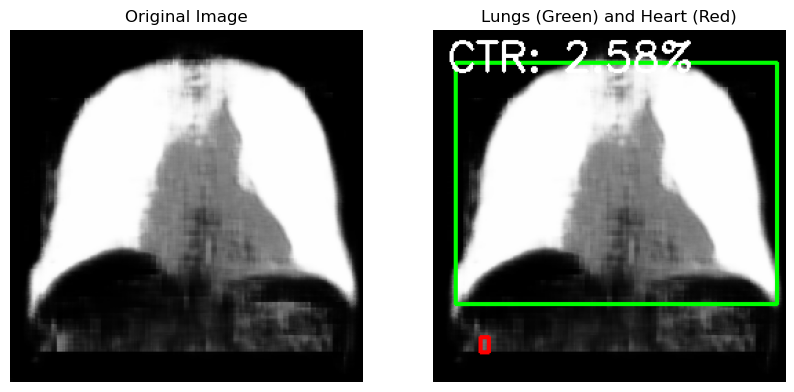

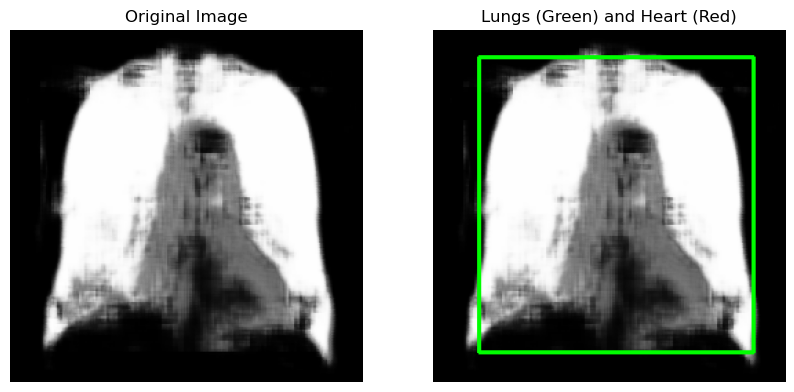

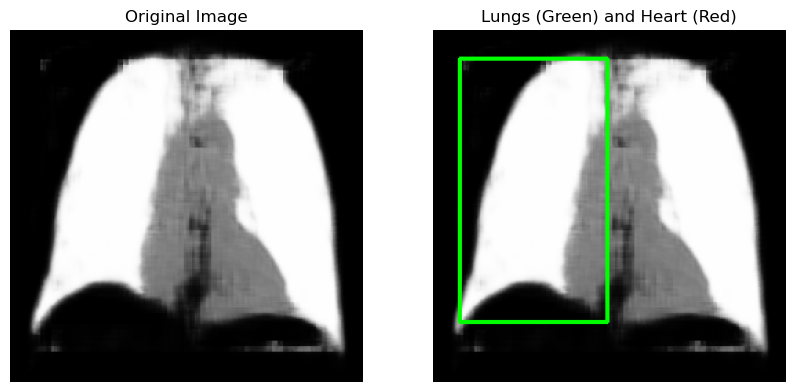

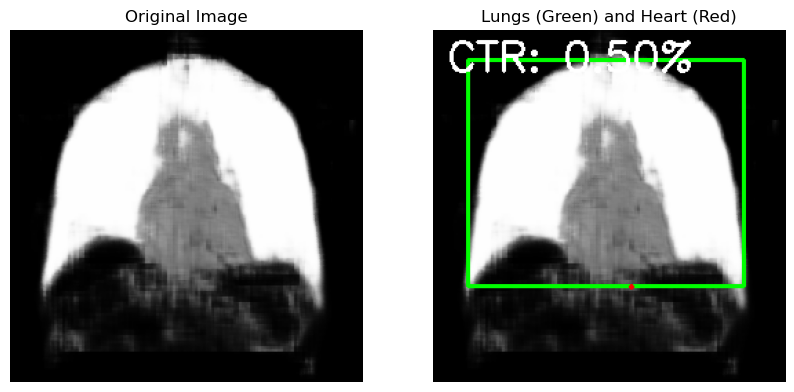

In [4]:
import cv2
import numpy as np
import os
import matplotlib.pyplot as plt

# Path to the directory containing the images
image_dir = r"C:\Users\DELL.COM\Desktop\Ephraim files\Generatedneww"

# Function to detect lungs, heart, and calculate CTR
def detect_and_calculate_ctr(image_path):
    # Load the image
    image = cv2.imread(image_path, cv2.IMREAD_GRAYSCALE)
    original_image = cv2.cvtColor(image, cv2.COLOR_GRAY2BGR)  # Convert for colored drawing

    # Threshold for lungs (white regions)
    _, lungs_mask = cv2.threshold(image, 200, 255, cv2.THRESH_BINARY)

    # Threshold for heart (grey regions)
    heart_mask = cv2.inRange(image, 100, 200)  # Adjust range as needed for grey pixels

    # Morphological operations to clean up the masks
    kernel = cv2.getStructuringElement(cv2.MORPH_RECT, (5, 5))
    lungs_mask = cv2.morphologyEx(lungs_mask, cv2.MORPH_CLOSE, kernel)
    heart_mask = cv2.morphologyEx(heart_mask, cv2.MORPH_CLOSE, kernel)

    # Find contours for lungs
    lung_contours, _ = cv2.findContours(lungs_mask, cv2.RETR_EXTERNAL, cv2.CHAIN_APPROX_SIMPLE)

    # Find contours for heart
    heart_contours, _ = cv2.findContours(heart_mask, cv2.RETR_EXTERNAL, cv2.CHAIN_APPROX_SIMPLE)

    # Initialize bounding boxes
    lung_bbox = None
    heart_bbox = None

    # Find the largest contour for lungs
    max_area = 0
    for cnt in lung_contours:
        area = cv2.contourArea(cnt)
        if area > max_area:
            max_area = area
            lung_bbox = cv2.boundingRect(cnt)

    # Draw bounding box for lungs in GREEN
    if lung_bbox:
        x, y, w, h = lung_bbox
        cv2.rectangle(original_image, (x, y), (x + w, y + h), (0, 255, 0), 2)

    # Find the heart contour inside the lung region
    for cnt in heart_contours:
        x, y, w, h = cv2.boundingRect(cnt)
        # Check if the heart is within the lung region
        if lung_bbox and (x > lung_bbox[0] and x + w < lung_bbox[0] + lung_bbox[2]):
            heart_bbox = (x, y, w, h)
            cv2.rectangle(original_image, (x, y), (x + w, y + h), (0, 0, 255), 2)
            break  # Stop after the first valid heart contour

    # Calculate CTR
    ctr = None
    if lung_bbox and heart_bbox:
        thorax_width = lung_bbox[2]
        heart_width = heart_bbox[2]
        ctr = (heart_width / thorax_width) * 100

        # Display CTR value on the image
        ctr_text = f"CTR: {ctr:.2f}%"
        cv2.putText(original_image, ctr_text, (10, 30), cv2.FONT_HERSHEY_SIMPLEX, 1, (255, 255, 255), 2)

    # Display the original and processed images side by side
    plt.figure(figsize=(10, 5))
    plt.subplot(1, 2, 1)
    plt.title("Original Image")
    plt.imshow(cv2.cvtColor(image, cv2.COLOR_GRAY2RGB))
    plt.axis('off')

    plt.subplot(1, 2, 2)
    plt.title("Lungs (Green) and Heart (Red)")
    plt.imshow(cv2.cvtColor(original_image, cv2.COLOR_BGR2RGB))
    plt.axis('off')

    plt.show()

# Loop through images in the directory
for filename in os.listdir(image_dir):
    if filename.endswith('.png') or filename.endswith('.jpg'):
        image_path = os.path.join(image_dir, filename)
        detect_and_calculate_ctr(image_path)


1/1 ━━━━━━━━━━━━━━━━━━━━ 5s 5s/step
Saved: C:\Users\DELL.COM\Desktop\Ephraim files\Generatedneww\mask_0BI MARY DOMINIC.20231110.164050.IN652154-0.png
Saved: C:\Users\DELL.COM\Desktop\Ephraim files\Generatedneww\mask_0GAR INNOCENT UKEH.20220615.102422.RAD1424-6-22-0.png
Saved: C:\Users\DELL.COM\Desktop\Ephraim files\Generatedneww\mask_ABANG PETER.20220316.120836.RAD365-3-22-0.png
Saved: C:\Users\DELL.COM\Desktop\Ephraim files\Generatedneww\mask_ABASIKPONKE GEORGE UDO.20220314.125006.RAD314-3-22-0.png
Saved: C:\Users\DELL.COM\Desktop\Ephraim files\Generatedneww\mask_ABASIKPONKE GEORGE UDO.20220314.154334.RAD281-03-22-0.png
Saved: C:\Users\DELL.COM\Desktop\Ephraim files\Generatedneww\mask_ABIAGAM DORIS IKAN.20220601.130948.RAD1242-6-22-0.png
Saved: C:\Users\DELL.COM\Desktop\Ephraim files\Generatedneww\mask_ABU JOHN EKAHEM.20220404.141344.RAD719-4-22-0.png
Saved: C:\Users\DELL.COM\Desktop\Ephraim files\Generatedneww\mask_ABUA ANGELA UKONGZI.20220303.150210.RAD159-03-22-0.png
Saved: C:\User

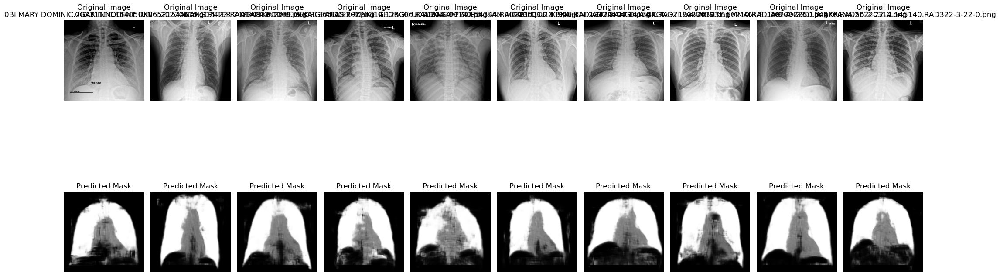

In [2]:
import tensorflow as tf
import numpy as np
import matplotlib.pyplot as plt
import os
import cv2

# Paths
image_folder = r"C:\Users\DELL.COM\Desktop\Ephraim files\My CTR Data"
model_save_path = r"C:\Users\DELL.COM\Desktop\Ephraim files\CTR_UNet_Model.keras"
save_folder = r"C:\Users\DELL.COM\Desktop\Ephraim files\Generatedneww"

# Ensure save directory exists
os.makedirs(save_folder, exist_ok=True)

# Load the model
model = tf.keras.models.load_model(model_save_path)

# Function to preprocess images for testing
def preprocess_images(image_folder, target_size=(256, 256), num_images=10):
    image_paths = sorted([os.path.join(image_folder, f) for f in os.listdir(image_folder) if f.endswith('.png')])
    images = [tf.keras.utils.load_img(path, target_size=target_size, color_mode="grayscale") for path in image_paths[:num_images]]
    images = np.array([np.array(img) / 255.0 for img in images])  # Normalize
    return images[..., np.newaxis], image_paths[:num_images]  # Add channel dimension

# Preprocess the first 10 images
test_images, test_image_paths = preprocess_images(image_folder, num_images=10)

# Generate masks using the model
predicted_masks = model.predict(test_images)

# Save masks
for i, mask in enumerate(predicted_masks):
    mask = (mask * 255).astype(np.uint8)  # Scale mask values to 0-255
    save_path = os.path.join(save_folder, f"mask_{os.path.basename(test_image_paths[i])}")
    cv2.imwrite(save_path, mask)
    print(f"Saved: {save_path}")

# Display the images and their predicted masks
def display_images_and_masks(images, masks, image_paths, num_to_display=10):
    plt.figure(figsize=(20, 10))
    for i in range(num_to_display):
        # Original image
        plt.subplot(2, num_to_display, i + 1)
        plt.imshow(images[i, :, :, 0], cmap='gray')
        plt.title(f"Original Image\n{os.path.basename(image_paths[i])}")
        plt.axis('off')

        # Predicted mask
        plt.subplot(2, num_to_display, num_to_display + i + 1)
        plt.imshow(masks[i, :, :, 0], cmap='gray')
        plt.title("Predicted Mask")
        plt.axis('off')

    plt.tight_layout()
    plt.show()

# Display the first 10 images and their masks
display_images_and_masks(test_images, predicted_masks, test_image_paths)


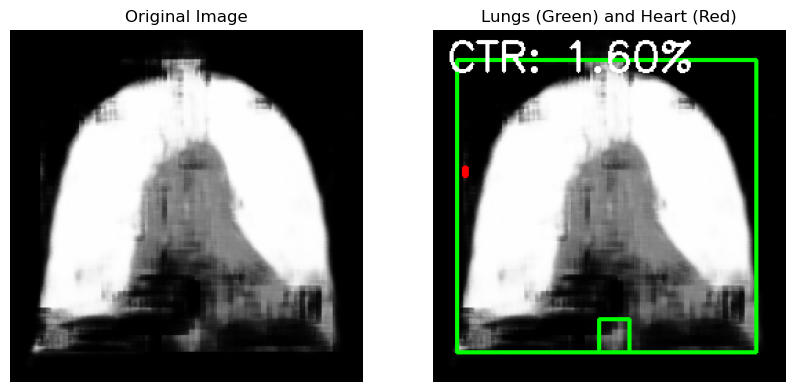

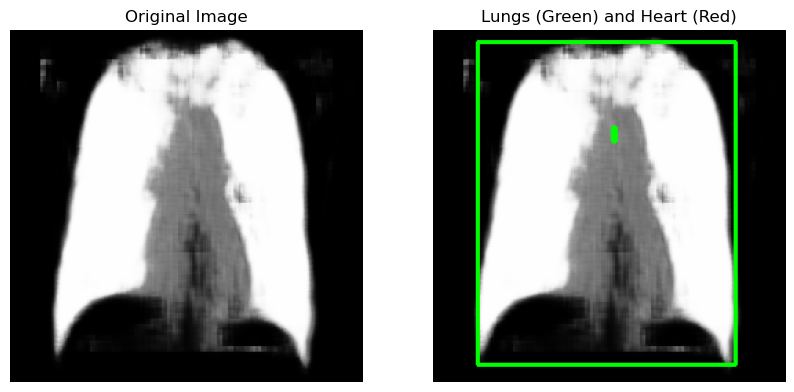

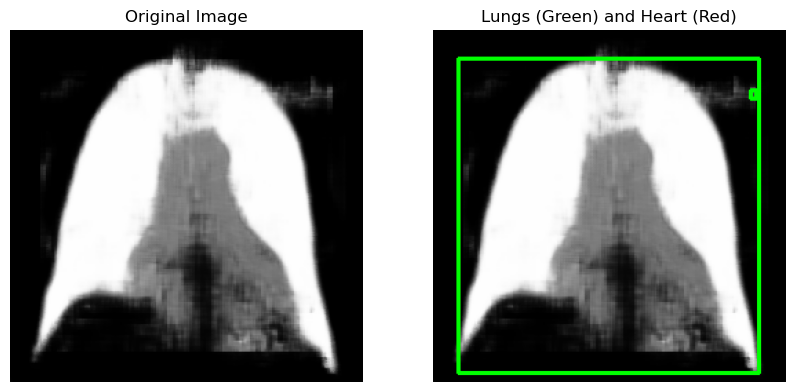

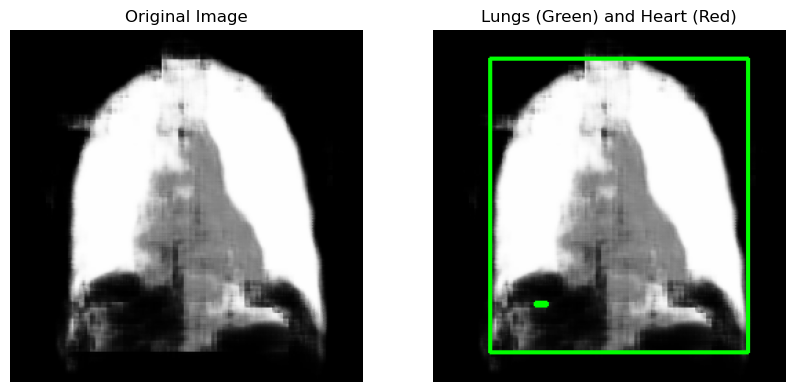

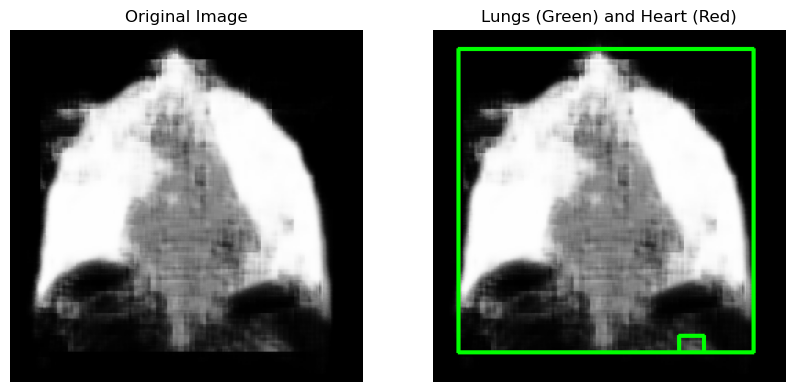

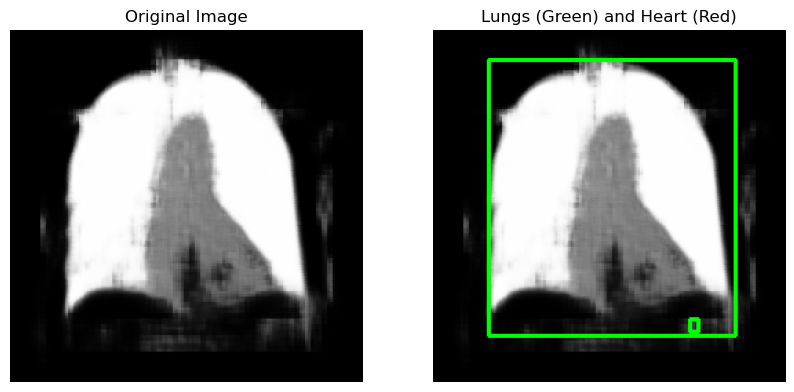

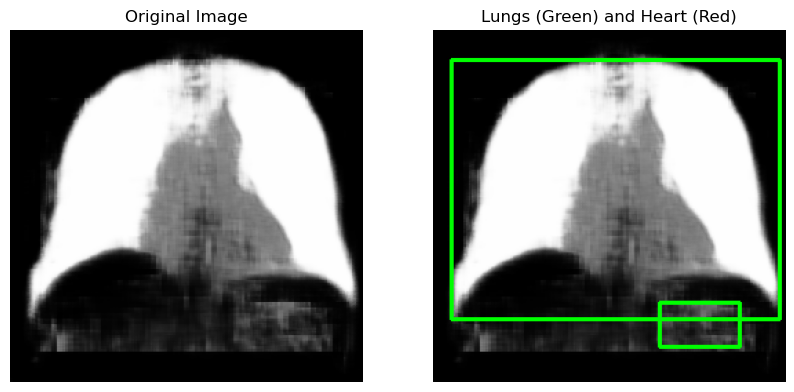

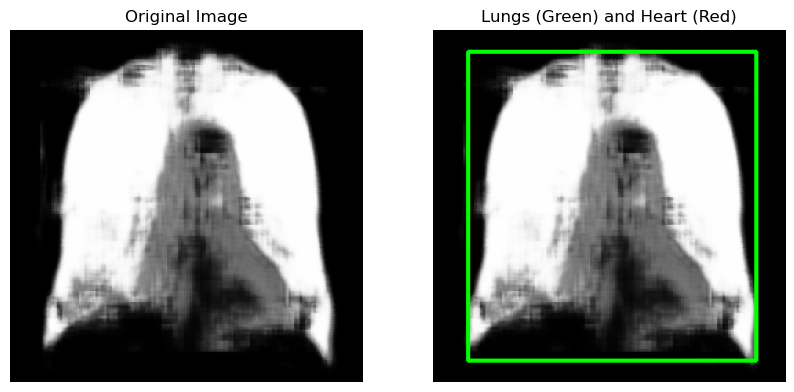

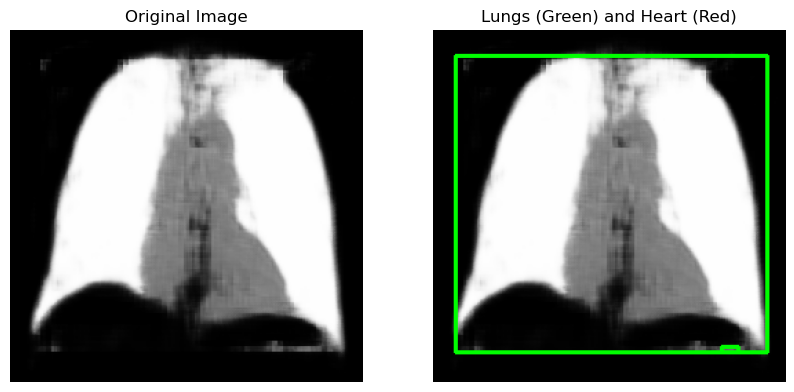

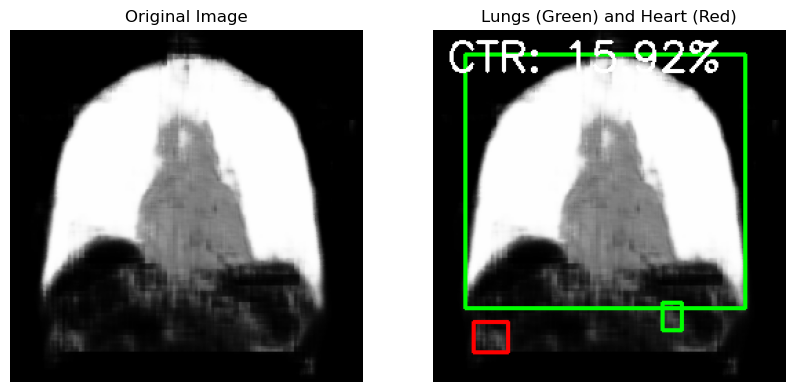

In [6]:
import cv2
import numpy as np
import os
import matplotlib.pyplot as plt

# Path to image directory
image_dir = r"C:\Users\DELL.COM\Desktop\Ephraim files\Generatedneww"

# Function to detect lungs, heart, and calculate CTR
def detect_and_calculate_ctr(image_path):
    # Load the image
    image = cv2.imread(image_path, cv2.IMREAD_GRAYSCALE)
    original_image = cv2.cvtColor(image, cv2.COLOR_GRAY2BGR)

    # Apply CLAHE for contrast enhancement
    clahe = cv2.createCLAHE(clipLimit=2.0, tileGridSize=(8, 8))
    image_clahe = clahe.apply(image)

    # Otsu's thresholding for lung segmentation
    _, lung_mask = cv2.threshold(image_clahe, 0, 255, cv2.THRESH_BINARY + cv2.THRESH_OTSU)

    # Morphological closing to refine lung mask
    kernel = np.ones((5, 5), np.uint8)
    lung_mask = cv2.morphologyEx(lung_mask, cv2.MORPH_CLOSE, kernel)

    # Find lung contours
    lung_contours, _ = cv2.findContours(lung_mask, cv2.RETR_EXTERNAL, cv2.CHAIN_APPROX_SIMPLE)
    lung_contours = sorted(lung_contours, key=cv2.contourArea, reverse=True)[:2]  # Select top 2 largest

    lung_bboxes = []
    for cnt in lung_contours:
        x, y, w, h = cv2.boundingRect(cnt)
        lung_bboxes.append((x, y, w, h))
        cv2.rectangle(original_image, (x, y), (x + w, y + h), (0, 255, 0), 2)  # Green for lungs

    # Merge lung bounding boxes
    if len(lung_bboxes) == 2:
        x1, _, w1, _ = lung_bboxes[0]
        x2, _, w2, _ = lung_bboxes[1]
        thorax_width = abs((x2 + w2) - x1)

        # K-means clustering for heart segmentation
        image_reshaped = image_clahe.reshape(-1, 1)
        image_reshaped = np.float32(image_reshaped)

        k = 3  # Three clusters (background, lungs, heart)
        _, labels, centers = cv2.kmeans(image_reshaped, k, None,
                                        (cv2.TERM_CRITERIA_EPS + cv2.TERM_CRITERIA_MAX_ITER, 10, 1.0),
                                        10, cv2.KMEANS_RANDOM_CENTERS)

        centers = np.uint8(centers)
        clustered_image = centers[labels.flatten()]
        clustered_image = clustered_image.reshape(image.shape)

        # Extract the heart region (middle intensity cluster)
        heart_mask = cv2.inRange(clustered_image, centers[1], centers[2])
        heart_mask = cv2.morphologyEx(heart_mask, cv2.MORPH_CLOSE, kernel)

        # Find heart contour
        heart_contours, _ = cv2.findContours(heart_mask, cv2.RETR_EXTERNAL, cv2.CHAIN_APPROX_SIMPLE)
        heart_bbox = None
        max_area = 0
        for cnt in heart_contours:
            x, y, w, h = cv2.boundingRect(cnt)
            if x > x1 and (x + w) < (x2 + w2) and w * h > max_area:
                max_area = w * h
                heart_bbox = (x, y, w, h)

        # Draw heart bounding box in RED
        if heart_bbox:
            x, y, w, h = heart_bbox
            cv2.rectangle(original_image, (x, y), (x + w, y + h), (0, 0, 255), 2)  # Red for heart
            ctr = (w / thorax_width) * 100

            # Display CTR
            cv2.putText(original_image, f"CTR: {ctr:.2f}%", (10, 30), cv2.FONT_HERSHEY_SIMPLEX, 1, (255, 255, 255), 2)

    # Show results
    plt.figure(figsize=(10, 5))
    plt.subplot(1, 2, 1)
    plt.title("Original Image")
    plt.imshow(cv2.cvtColor(image, cv2.COLOR_GRAY2RGB))
    plt.axis('off')

    plt.subplot(1, 2, 2)
    plt.title("Lungs (Green) and Heart (Red)")
    plt.imshow(cv2.cvtColor(original_image, cv2.COLOR_BGR2RGB))
    plt.axis('off')

    plt.show()

# Process all images in the directory
for filename in os.listdir(image_dir):
    if filename.endswith('.png') or filename.endswith('.jpg'):
        image_path = os.path.join(image_dir, filename)
        detect_and_calculate_ctr(image_path)


In [26]:
import json

# Define the input and output file paths
json_path = r"C:\Users\DELL.COM\Desktop\Ephraim files\CTR_ANNOTATION.json"
output_json_path = r"C:\Users\DELL.COM\Desktop\Ephraim files\CTR_ANNOTATION_reordered.json"

# Load the JSON data
with open(json_path, "r") as file:
    data = json.load(file)

# Define the correct order (Lungs first, Heart last)
LUNGS_CATEGORY_ID = 1  # Replace with the actual category ID for lungs
HEART_CATEGORY_ID = 2  # Replace with the actual category ID for heart

# Function to reorder annotations
def reorder_annotations(annotations):
    if not isinstance(annotations, list):  # Ensure annotations is a list
        return annotations

    try:
        return sorted(annotations, key=lambda x: x["category_id"] if isinstance(x, dict) and "category_id" in x else float('inf'))
    except Exception as e:
        print(f"Error sorting annotations: {e}")
        return annotations

# Apply sorting to annotations
for annotation in data["annotations"]:
    if isinstance(annotation, dict) and "segmentation" in annotation:
        annotation["segmentation"] = reorder_annotations(annotation["segmentation"])

# Save the reordered JSON data
with open(output_json_path, "w") as file:
    json.dump(data, file, indent=4)

print("Reordered JSON file saved successfully.")


Reordered JSON file saved successfully.


In [27]:
import json
import os

# Paths
json_path = r"C:\Users\DELL.COM\Desktop\Ephraim files\CTR_ANNOTATION_reordered.json"
image_folder = r"C:\Users\DELL.COM\Desktop\Ephraim files\My CTR Data\Preprocessed"

# Load JSON file
with open(json_path, "r") as file:
    data = json.load(file)

# Extract image filenames from JSON
json_images = {img["file_name"] for img in data["images"]}

# Get filenames from the Preprocessed folder
folder_images = {file for file in os.listdir(image_folder) if file.lower().endswith(('.png', '.jpg', '.jpeg'))}

# Find missing and extra images
missing_images = json_images - folder_images
extra_images = folder_images - json_images

# Print results
print(f"Total Images in JSON: {len(json_images)}")
print(f"Total Images in Folder: {len(folder_images)}")
print(f"Missing Images (in JSON but not in folder): {len(missing_images)}")
print(f"Extra Images (in folder but not in JSON): {len(extra_images)}")

if missing_images:
    print("\nMissing Files:")
    print("\n".join(sorted(missing_images)[:10]))  # Show first 10

if extra_images:
    print("\nExtra Files:")
    print("\n".join(sorted(extra_images)[:10]))  # Show first 10


Total Images in JSON: 752
Total Images in Folder: 752
Missing Images (in JSON but not in folder): 0
Extra Images (in folder but not in JSON): 0


In [33]:
import json

# Paths
json_path = r"C:\Users\DELL.COM\Desktop\Ephraim files\CTR_ANNOTATION_reordered.json"
output_json_path = r"C:\Users\DELL.COM\Desktop\Ephraim files\CTR_ANNOTATION_fixed.json"

# Define category IDs (adjust if needed)
LUNGS_CATEGORY_ID = 1  # Lungs originally labeled as 1
HEART_CATEGORY_ID = 2  # Heart originally labeled as 2

# Load JSON file
with open(json_path, "r") as file:
    data = json.load(file)

# Swap category IDs
for annotation in data["annotations"]:
    if annotation["category_id"] == LUNGS_CATEGORY_ID:
        annotation["category_id"] = HEART_CATEGORY_ID
    elif annotation["category_id"] == HEART_CATEGORY_ID:
        annotation["category_id"] = LUNGS_CATEGORY_ID

# Save the updated JSON
with open(output_json_path, "w") as file:
    json.dump(data, file, indent=4)

print("✅ Category IDs swapped! The new JSON is saved at:", output_json_path)


✅ Category IDs swapped! The new JSON is saved at: C:\Users\DELL.COM\Desktop\Ephraim files\CTR_ANNOTATION_fixed.json


In [38]:
import os
import json
import numpy as np
import cv2

# Paths
json_path = r"C:\Users\DELL.COM\Desktop\Ephraim files\CTR_ANNOTATION_fixed.json"
image_dir = r"C:\Users\DELL.COM\Desktop\Ephraim files\My CTR Data\Preprocessed"
output_mask_dir = r"C:\Users\DELL.COM\Desktop\Ephraim files\Heart_Masks"

# Ensure output directory exists
os.makedirs(output_mask_dir, exist_ok=True)

# Load JSON annotations
with open(json_path, "r") as f:
    data = json.load(f)

# Define category mapping (Ensure correct category IDs)
CATEGORY_MAPPING = {"heart": 2}  # Assuming heart category_id = 2

# Process each image annotation
for img_data in data["images"]:
    img_name = img_data["file_name"]
    img_path = os.path.join(image_dir, img_name)

    # Read image to get dimensions
    img = cv2.imread(img_path, cv2.IMREAD_GRAYSCALE)
    if img is None:
        print(f"Skipping {img_name} (not found)")
        continue
    
    height, width = img.shape[:2]
    
    # Create blank mask
    heart_mask = np.zeros((height, width), dtype=np.uint8)

    # Get annotations for the image
    annotations = [ann for ann in data["annotations"] if ann["image_id"] == img_data["id"]]

    # Draw only the heart segmentation
    for ann in annotations:
        if ann["category_id"] == CATEGORY_MAPPING["heart"]:
            segmentation = ann["segmentation"]
            for seg in segmentation:
                points = np.array(seg, dtype=np.int32).reshape(-1, 2)
                cv2.fillPoly(heart_mask, [points], 255)  # White heart

    # Save the mask
    mask_path = os.path.join(output_mask_dir, img_name)
    cv2.imwrite(mask_path, heart_mask)

print("Heart masks generated successfully!")


Heart masks generated successfully!


In [40]:
import os
import json
import numpy as np
import cv2

# Paths
json_path = r"C:\Users\DELL.COM\Desktop\Ephraim files\CTR_ANNOTATION_fixed.json"
image_dir = r"C:\Users\DELL.COM\Desktop\Ephraim files\My CTR Data\Preprocessed"
output_mask_dir = r"C:\Users\DELL.COM\Desktop\Ephraim files\Lungs_Masks"

# Ensure output directory exists
os.makedirs(output_mask_dir, exist_ok=True)

# Load JSON annotations
with open(json_path, "r") as f:
    data = json.load(f)

# Define category mapping (Ensure correct category IDs)
CATEGORY_MAPPING = {"lungs": 1}  # Assuming lungs category_id = 1

# Process each image annotation
for img_data in data["images"]:
    img_name = img_data["file_name"]
    img_path = os.path.join(image_dir, img_name)

    # Read image to get dimensions
    img = cv2.imread(img_path, cv2.IMREAD_GRAYSCALE)
    if img is None:
        print(f"Skipping {img_name} (not found)")
        continue
    
    height, width = img.shape[:2]
    
    # Create blank mask
    lungs_mask = np.zeros((height, width), dtype=np.uint8)

    # Get annotations for the image
    annotations = [ann for ann in data["annotations"] if ann["image_id"] == img_data["id"]]

    # Draw only the lungs segmentation
    for ann in annotations:
        if ann["category_id"] == CATEGORY_MAPPING["lungs"]:
            segmentation = ann["segmentation"]
            for seg in segmentation:
                points = np.array(seg, dtype=np.int32).reshape(-1, 2)
                cv2.fillPoly(lungs_mask, [points], 255)  # White lungs

    # Save the mask
    mask_path = os.path.join(output_mask_dir, img_name)
    cv2.imwrite(mask_path, lungs_mask)

print("Lungs masks generated successfully!")


Lungs masks generated successfully!


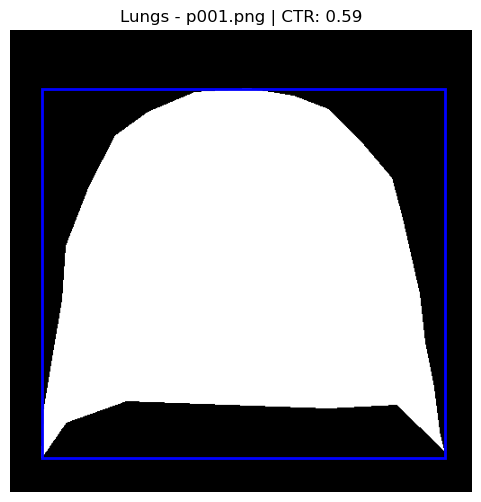

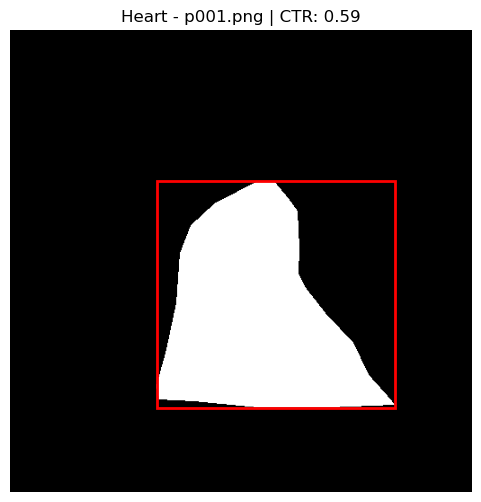

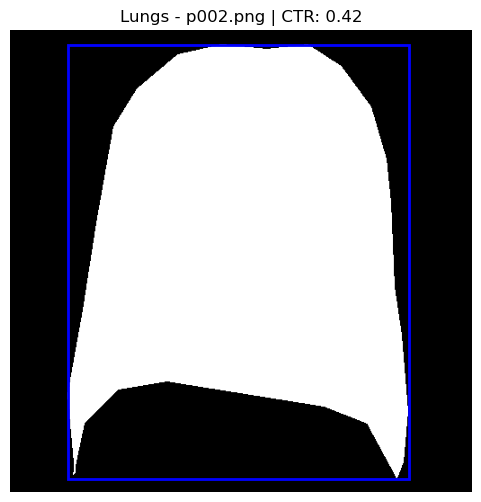

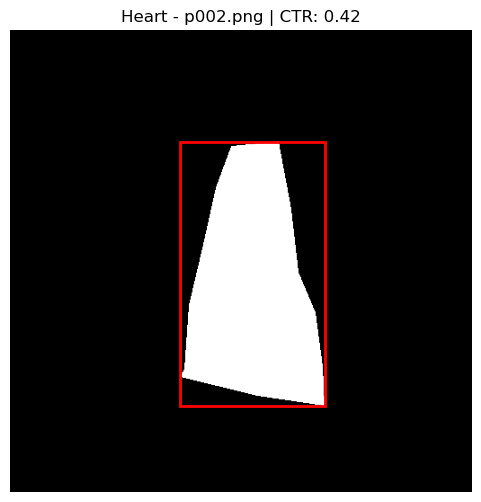

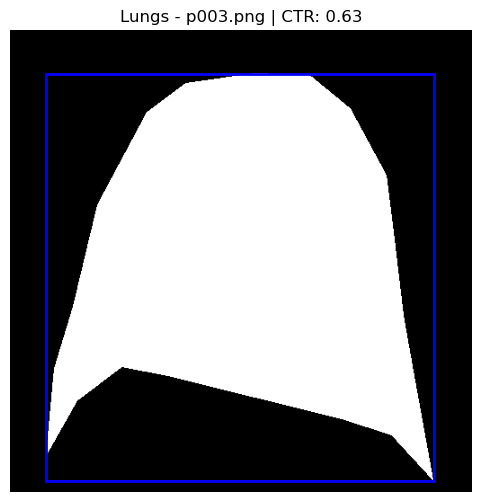

...

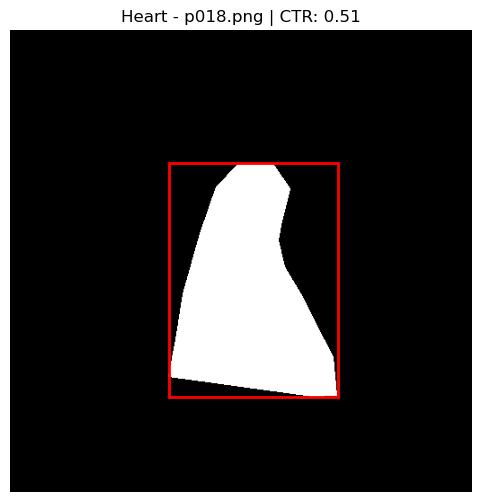

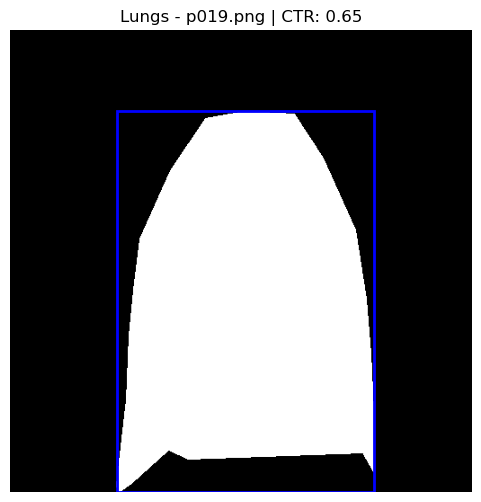

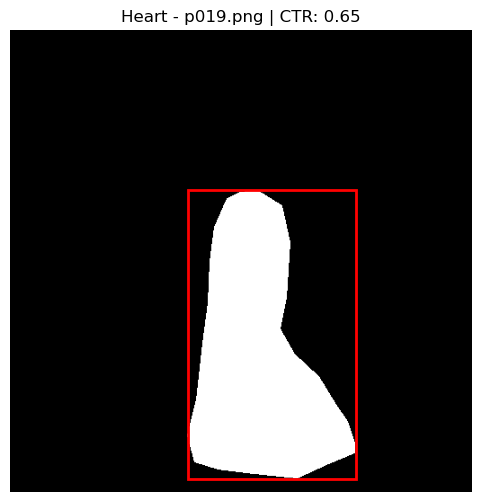

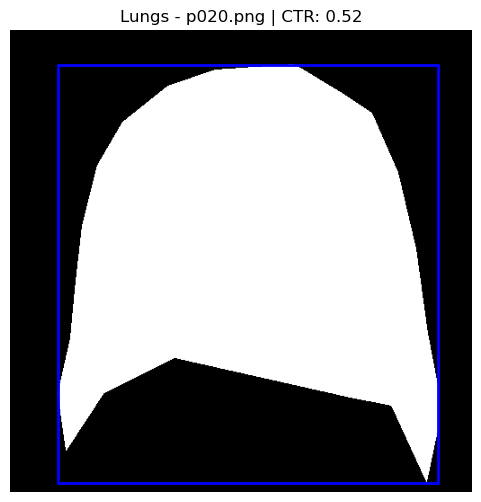

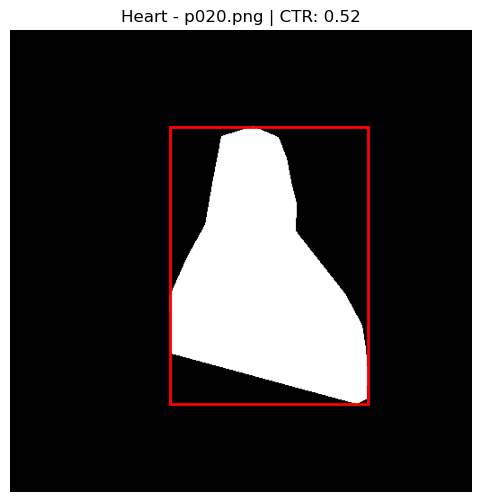

CTR calculations complete!


In [42]:
import os
import cv2
import numpy as np
import matplotlib.pyplot as plt

# Paths to segmentation masks
lungs_mask_dir = r"C:\Users\DELL.COM\Desktop\Ephraim files\Lungs_Masks"
heart_mask_dir = r"C:\Users\DELL.COM\Desktop\Ephraim files\Heart_Masks"

# List of images to process (p001 to p020)
image_list = [f"p{str(i).zfill(3)}.png" for i in range(1, 21)]

# Function to get bounding box coordinates
def get_bounding_box(mask):
    """Finds the bounding box around a binary mask."""
    coords = cv2.findNonZero(mask)
    if coords is not None:
        x, y, w, h = cv2.boundingRect(coords)
        return x, y, x + w, y + h  # (x_min, y_min, x_max, y_max)
    return None

# Process each image
for img_name in image_list:
    lung_mask_path = os.path.join(lungs_mask_dir, img_name)
    heart_mask_path = os.path.join(heart_mask_dir, img_name)

    # Load masks
    lung_mask = cv2.imread(lung_mask_path, cv2.IMREAD_GRAYSCALE)
    heart_mask = cv2.imread(heart_mask_path, cv2.IMREAD_GRAYSCALE)

    if lung_mask is None or heart_mask is None:
        print(f"Skipping {img_name}, mask not found")
        continue

    # Get bounding boxes
    lung_bbox = get_bounding_box(lung_mask)
    heart_bbox = get_bounding_box(heart_mask)

    if lung_bbox and heart_bbox:
        # Extract widths
        lung_width = lung_bbox[2] - lung_bbox[0]
        heart_width = heart_bbox[2] - heart_bbox[0]
        ctr = heart_width / lung_width if lung_width > 0 else 0

        # Visualization - Lungs
        fig, ax = plt.subplots(figsize=(6, 6))
        ax.imshow(lung_mask, cmap="gray")
        if lung_bbox:
            x1, y1, x2, y2 = lung_bbox
            ax.add_patch(plt.Rectangle((x1, y1), x2 - x1, y2 - y1, edgecolor="blue", linewidth=2, fill=False))
        ax.set_title(f"Lungs - {img_name} | CTR: {ctr:.2f}")
        ax.axis("off")
        plt.show()

        # Visualization - Heart
        fig, ax = plt.subplots(figsize=(6, 6))
        ax.imshow(heart_mask, cmap="gray")
        if heart_bbox:
            x1, y1, x2, y2 = heart_bbox
            ax.add_patch(plt.Rectangle((x1, y1), x2 - x1, y2 - y1, edgecolor="red", linewidth=2, fill=False))
        ax.set_title(f"Heart - {img_name} | CTR: {ctr:.2f}")
        ax.axis("off")
        plt.show()

print("CTR calculations complete!")


In [ ]:
import os
import cv2
import numpy as np
import albumentations as A
from tqdm import tqdm

# Define directories
image_dir = r"C:\Users\DELL.COM\Desktop\Ephraim files\My CTR Data\Preprocessed_Heart"
mask_dir = r"C:\Users\DELL.COM\Desktop\Ephraim files\Heart_Masks"

# Output directories
augmented_image_dir = r"C:\Users\DELL.COM\Desktop\Ephraim files\Augmented_Heart"
augmented_mask_dir = r"C:\Users\DELL.COM\Desktop\Ephraim files\Augmented_Heart_Masks"

# Create directories if they do not exist
os.makedirs(augmented_image_dir, exist_ok=True)
os.makedirs(augmented_mask_dir, exist_ok=True)

# Number of augmented images per original image
num_augmentations = 5  

# Define augmentations
augmentations = A.Compose([
    A.ElasticTransform(alpha=1, sigma=50, p=0.7),  # Non-linear deformations
    A.GaussNoise(var_limit=(10.0, 50.0), p=0.7),  # Adds random noise
    A.RandomBrightnessContrast(brightness_limit=0.2, contrast_limit=0.2, p=0.7),  
    A.GridDistortion(num_steps=5, distort_limit=0.3, p=0.7),  
    A.RandomGamma(gamma_limit=(80, 120), p=0.7),  
    A.Resize(height=512, width=512, p=1.0)  # Ensures uniform size
], additional_targets={'mask': 'image'})  

# Process all images
for img_name in tqdm(os.listdir(image_dir), desc="Augmenting Images"):
    img_path = os.path.join(image_dir, img_name)
    mask_path = os.path.join(mask_dir, img_name)

    if not os.path.exists(mask_path):
        print(f"Skipping {img_name}, no matching mask found.")
        continue

    # Read image and mask
    image = cv2.imread(img_path)  
    mask = cv2.imread(mask_path, cv2.IMREAD_GRAYSCALE)  

    if image is None or mask is None:
        print(f"Error reading {img_name}, skipping...")
        continue

    # Expand grayscale mask to 3-channel for augmentation
    mask = np.stack([mask] * 3, axis=-1)  

    for i in range(num_augmentations):  # Generate multiple augmented images
        augmented = augmentations(image=image, mask=mask)
        aug_img, aug_mask = augmented["image"], augmented["mask"]

        # Convert mask back to grayscale
        aug_mask = cv2.cvtColor(aug_mask, cv2.COLOR_BGR2GRAY)

        # Ensure mask remains binary (0 or 255)
        aug_mask = (aug_mask > 127).astype(np.uint8) * 255  

        # Save augmented image & mask
        cv2.imwrite(os.path.join(augmented_image_dir, f"aug_{i}_{img_name}"), aug_img)
        cv2.imwrite(os.path.join(augmented_mask_dir, f"aug_{i}_{img_name}"), aug_mask)

print("✅ Augmentation Complete! Check Augmented_Heart & Augmented_Heart_Masks.")


C:\Users\DELL.COM\AppData\Local\Temp\ipykernel_10036\3398333027.py:25: UserWarning: Argument(s) 'var_limit' are not valid for transform GaussNoise
  A.GaussNoise(var_limit=(10.0, 50.0), p=0.7),  # Adds random noise
Augmenting Images: 100%|██████████| 752/752 [11:30<00:00,  1.09it/s]

✅ Augmentation Complete! Check Augmented_Heart & Augmented_Heart_Masks.


In [8]:
import os
import numpy as np
import tensorflow as tf
from tensorflow.keras.callbacks import ModelCheckpoint
from sklearn.model_selection import train_test_split

# Define directories
original_image_dir = r"C:\Users\DELL.COM\Desktop\Ephraim files\My CTR Data\Preprocessed_Heart"
original_mask_dir = r"C:\Users\DELL.COM\Desktop\Ephraim files\Heart_Masks"
augmented_image_dir = r"C:\Users\DELL.COM\Desktop\Ephraim files\Augmented_Heart"
augmented_mask_dir = r"C:\Users\DELL.COM\Desktop\Ephraim files\Augmented_Heart_Masks"
model_save_path = r"C:\Users\DELL.COM\Desktop\Ephraim files\CTR_UNet_FineTuned.keras"

# Function to load images and masks from a given folder
def load_data(image_folder, mask_folder):
    image_paths = sorted([os.path.join(image_folder, f) for f in os.listdir(image_folder) if f.endswith('.png')])
    mask_paths = sorted([os.path.join(mask_folder, f) for f in os.listdir(mask_folder) if f.endswith('.png')])
    
    images = np.array([np.array(tf.keras.utils.load_img(path, target_size=(256, 256), color_mode="grayscale")) / 255.0 for path in image_paths])
    masks = np.array([np.array(tf.keras.utils.load_img(path, target_size=(256, 256), color_mode="grayscale")) / 255.0 for path in mask_paths])
    
    return images[..., np.newaxis], masks[..., np.newaxis]

# Load original and augmented data
print("📂 Loading original and augmented datasets...")
original_images, original_masks = load_data(original_image_dir, original_mask_dir)
augmented_images, augmented_masks = load_data(augmented_image_dir, augmented_mask_dir)

# Combine both datasets
images = np.concatenate([original_images, augmented_images], axis=0)
masks = np.concatenate([original_masks, augmented_masks], axis=0)

# Split data into training and testing sets
X_train, X_test, y_train, y_test = train_test_split(images, masks, test_size=0.2, random_state=42)
print(f"✅ Data loaded: {len(X_train)} training, {len(X_test)} testing")

# Load the existing model
if os.path.exists(model_save_path):
    print("🔄 Loading pre-trained model for fine-tuning...")
    model = tf.keras.models.load_model(model_save_path)
else:
    raise FileNotFoundError("❌ No trained model found! Train a model first before fine-tuning.")

# OPTIONAL: Modify the final layer to focus only on heart segmentation
print("🔧 Adjusting the final output layer for heart segmentation...")
model.layers[-1] = tf.keras.layers.Conv2D(1, (1, 1), activation='sigmoid')  # Output 1 channel for heart-only mask

# Recompile model for fine-tuning
model.compile(optimizer=tf.keras.optimizers.Adam(learning_rate=1e-4), 
              loss='binary_crossentropy', 
              metrics=['accuracy'])

# Setup model checkpoint to save improvements
checkpoint = ModelCheckpoint(model_save_path, save_best_only=True, monitor='val_loss', mode='min')

# Fine-tune the model
batch_size = 8
epochs = 20  # Fine-tuning doesn't need too many epochs

print("🚀 Fine-tuning model for heart-only segmentation...")
history = model.fit(
    X_train, y_train,
    validation_data=(X_test, y_test),
    batch_size=batch_size,
    epochs=epochs,
    callbacks=[checkpoint]
)

print(f"✅ Fine-tuning Complete! Model saved at {model_save_path}")


📂 Loading original and augmented datasets...
✅ Data loaded: 3616 training, 904 testing
🔄 Loading pre-trained model for fine-tuning...
🔧 Adjusting the final output layer for heart segmentation...
🚀 Fine-tuning model for heart-only segmentation...
Epoch 1/20
452/452 ━━━━━━━━━━━━━━━━━━━━ 13544s 29s/step - accuracy: 0.9566 - loss: 0.1087 - val_accuracy: 0.9577 - val_loss: 0.1050
Epoch 2/20
452/452 ━━━━━━━━━━━━━━━━━━━━ 13212s 29s/step - accuracy: 0.9601 - loss: 0.0996 - val_accuracy: 0.9579 - val_loss: 0.1055
Epoch 3/20
452/452 ━━━━━━━━━━━━━━━━━━━━ 13173s 29s/step - accuracy: 0.9600 - loss: 0.0989 - val_accuracy: 0.9584 - val_loss: 0.1031
Epoch 4/20
452/452 ━━━━━━━━━━━━━━━━━━━━ 13242s 29s/step - accuracy: 0.9619 - loss: 0.0948 - val_accuracy: 0.9558 - val_loss: 0.1078
Epoch 5/20
452/452 ━━━━━━━━━━━━━━━━━━━━ 12721s 28s/step - accuracy: 0.9609 - loss: 0.0965 - val_accuracy: 0.9604 - val_loss: 0.0980
Epoch 6/20
452/452 ━━━━━━━━━━━━━━━━━━━━ 13303s 29s/step - accuracy: 0.9619 - loss: 0.0947 - va

29/29 ━━━━━━━━━━━━━━━━━━━━ 557s 17s/step
✅ Model Evaluation Metrics
Accuracy: 0.9667
Sensitivity (Recall): 0.8424
Specificity: 0.9850
Precision: 0.8915
F1 Score: 0.8662
AUC-ROC: 0.9137


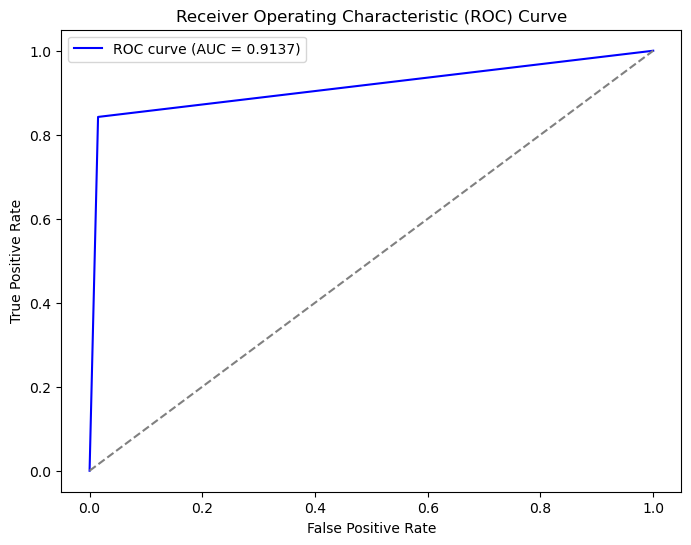

In [9]:
import numpy as np
import tensorflow as tf
from sklearn.metrics import classification_report, roc_curve, auc, confusion_matrix
import matplotlib.pyplot as plt

# Load test data
model_path = r"C:\Users\DELL.COM\Desktop\Ephraim files\CTR_UNet_FineTuned.keras"
model = tf.keras.models.load_model(model_path)

# Assuming X_test and y_test are already loaded (from your previous script)
y_pred = model.predict(X_test)
y_pred_binary = (y_pred > 0.5).astype(np.uint8)  # Convert probabilities to binary (0 or 1)

# Flatten the arrays for sklearn metrics
y_test_flat = y_test.flatten()
y_pred_flat = y_pred_binary.flatten()

# Calculate confusion matrix
tn, fp, fn, tp = confusion_matrix(y_test_flat, y_pred_flat).ravel()

# Compute metrics
accuracy = (tp + tn) / (tp + tn + fp + fn)
sensitivity = tp / (tp + fn)  # Recall
specificity = tn / (tn + fp)
precision = tp / (tp + fp)
f1 = 2 * (precision * sensitivity) / (precision + sensitivity)

# ROC Curve
fpr, tpr, _ = roc_curve(y_test_flat, y_pred_flat)
roc_auc = auc(fpr, tpr)

# Print classification report
print("✅ Model Evaluation Metrics")
print(f"Accuracy: {accuracy:.4f}")
print(f"Sensitivity (Recall): {sensitivity:.4f}")
print(f"Specificity: {specificity:.4f}")
print(f"Precision: {precision:.4f}")
print(f"F1 Score: {f1:.4f}")
print(f"AUC-ROC: {roc_auc:.4f}")

# Plot ROC Curve
plt.figure(figsize=(8, 6))
plt.plot(fpr, tpr, color='blue', label=f'ROC curve (AUC = {roc_auc:.4f})')
plt.plot([0, 1], [0, 1], color='gray', linestyle='--')
plt.xlabel('False Positive Rate')
plt.ylabel('True Positive Rate')
plt.title('Receiver Operating Characteristic (ROC) Curve')
plt.legend()
plt.show()


1/1 ━━━━━━━━━━━━━━━━━━━━ 5s 5s/step


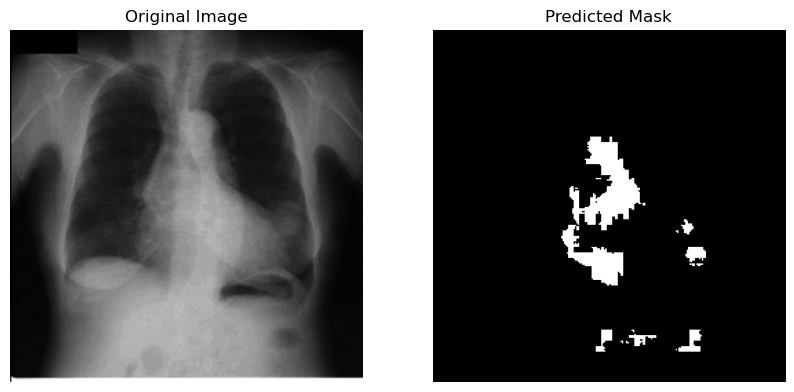

1/1 ━━━━━━━━━━━━━━━━━━━━ 5s 5s/step


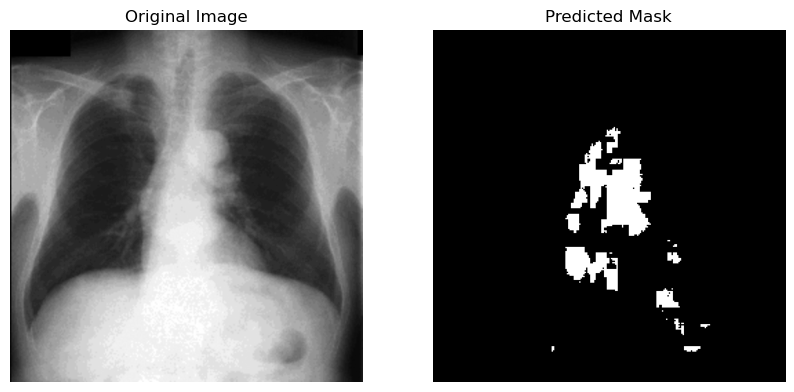

1/1 ━━━━━━━━━━━━━━━━━━━━ 5s 5s/step


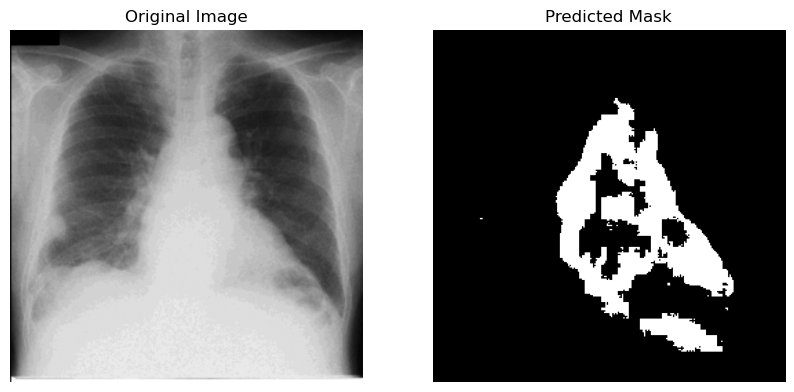

1/1 ━━━━━━━━━━━━━━━━━━━━ 4s 4s/step


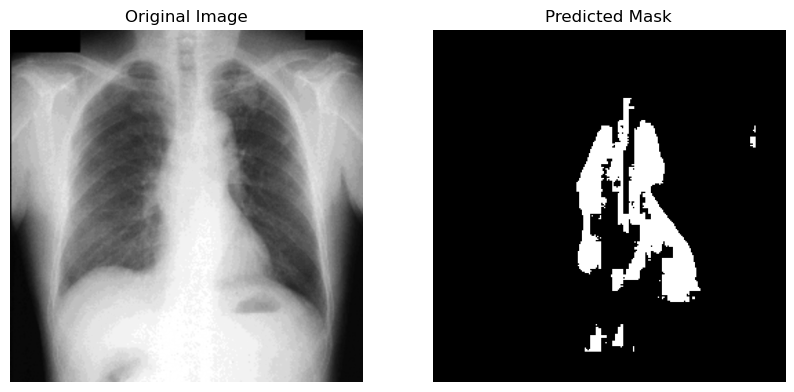

1/1 ━━━━━━━━━━━━━━━━━━━━ 4s 4s/step


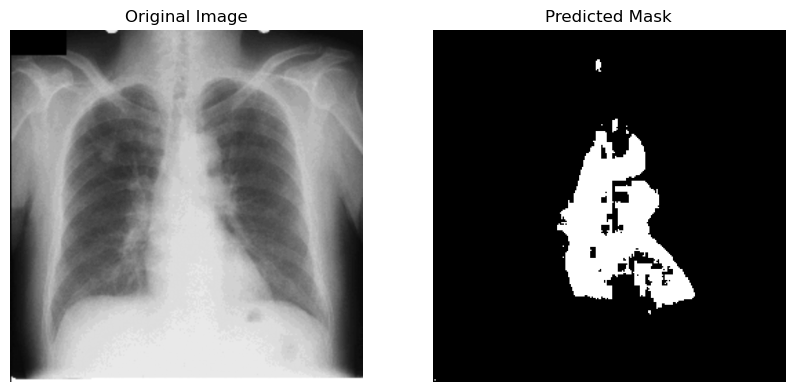

1/1 ━━━━━━━━━━━━━━━━━━━━ 4s 4s/step


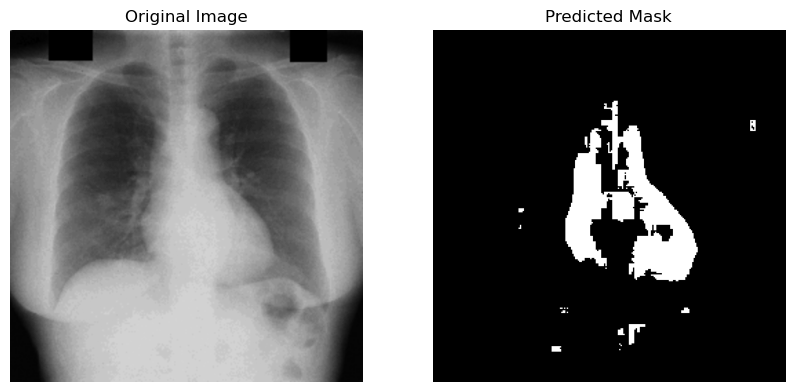

1/1 ━━━━━━━━━━━━━━━━━━━━ 4s 4s/step


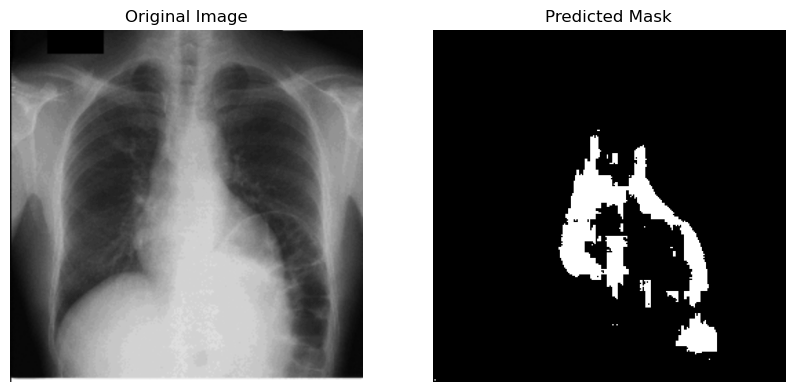

1/1 ━━━━━━━━━━━━━━━━━━━━ 7s 7s/step


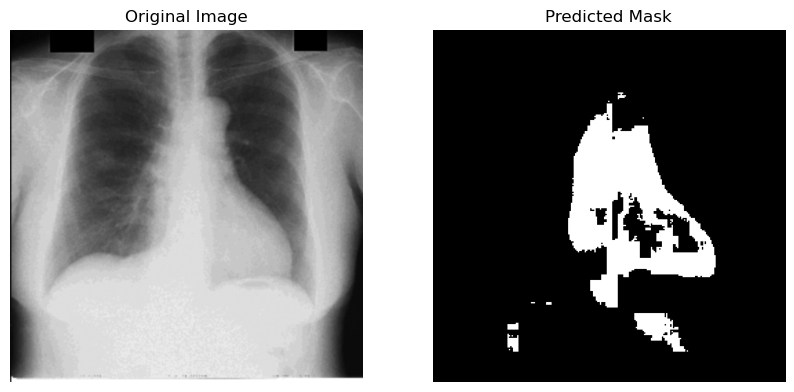

1/1 ━━━━━━━━━━━━━━━━━━━━ 5s 5s/step


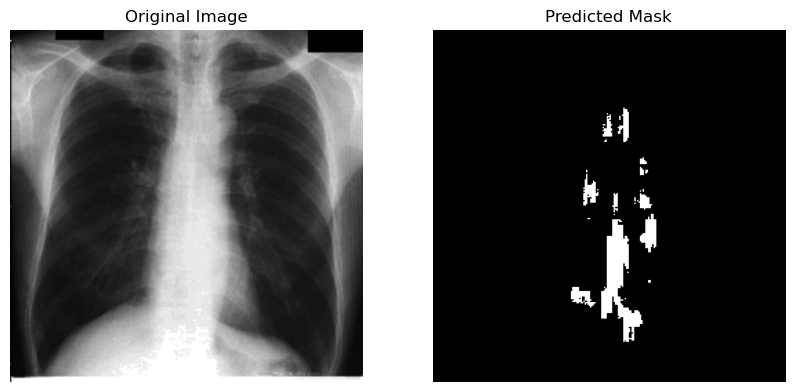

1/1 ━━━━━━━━━━━━━━━━━━━━ 4s 4s/step


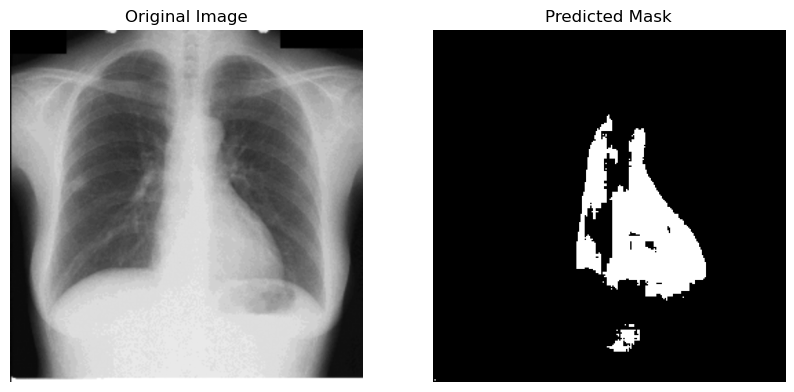

1/1 ━━━━━━━━━━━━━━━━━━━━ 4s 4s/step


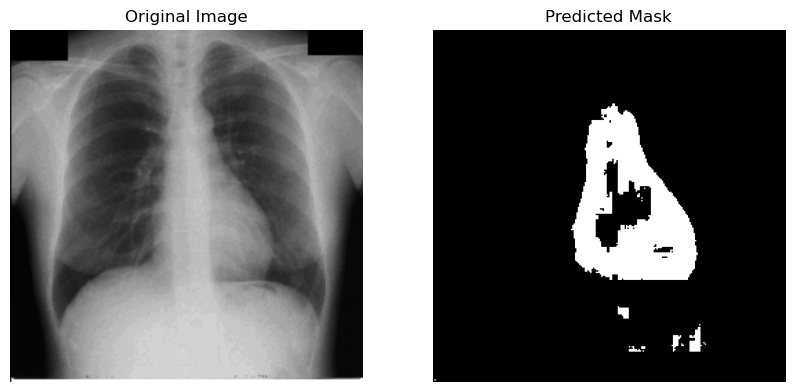

1/1 ━━━━━━━━━━━━━━━━━━━━ 4s 4s/step


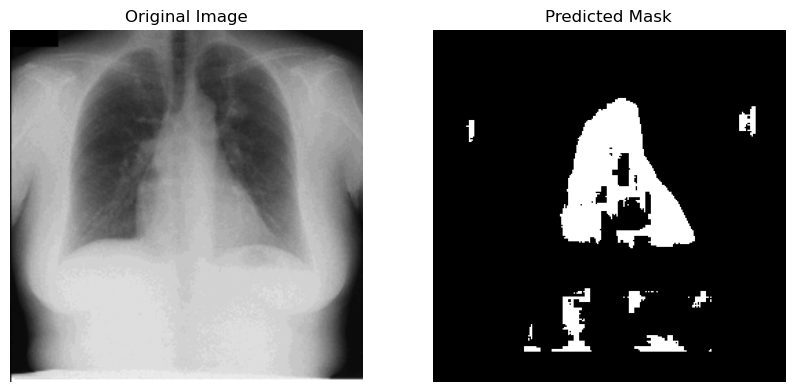

1/1 ━━━━━━━━━━━━━━━━━━━━ 4s 4s/step


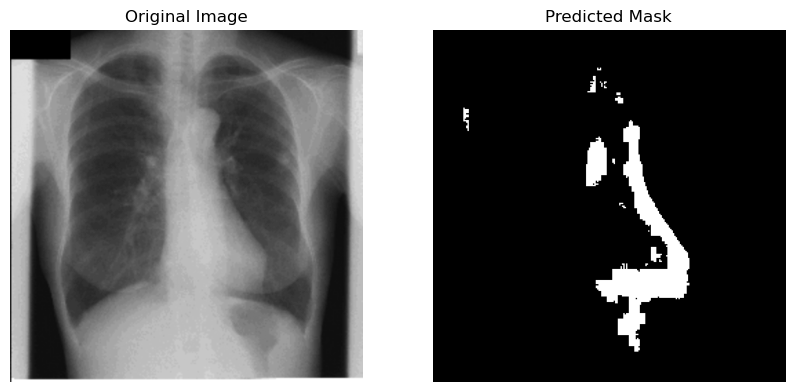

1/1 ━━━━━━━━━━━━━━━━━━━━ 5s 5s/step


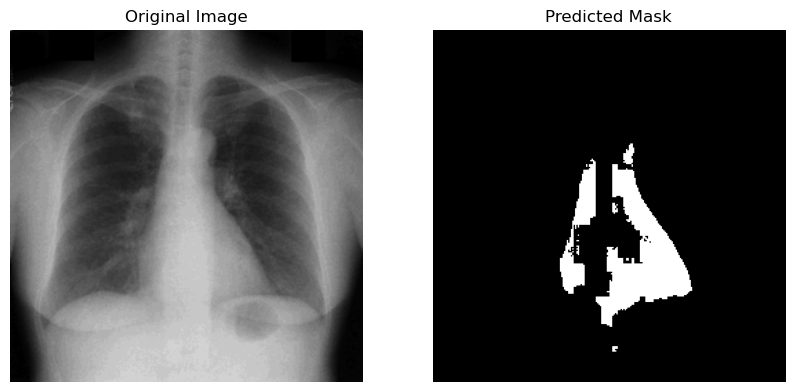

1/1 ━━━━━━━━━━━━━━━━━━━━ 4s 4s/step


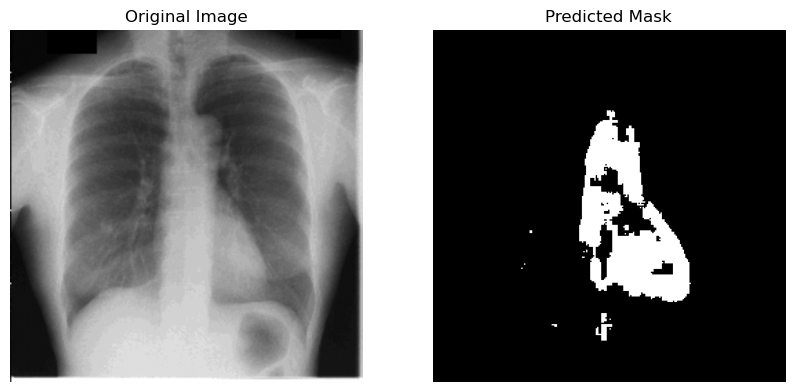

1/1 ━━━━━━━━━━━━━━━━━━━━ 4s 4s/step


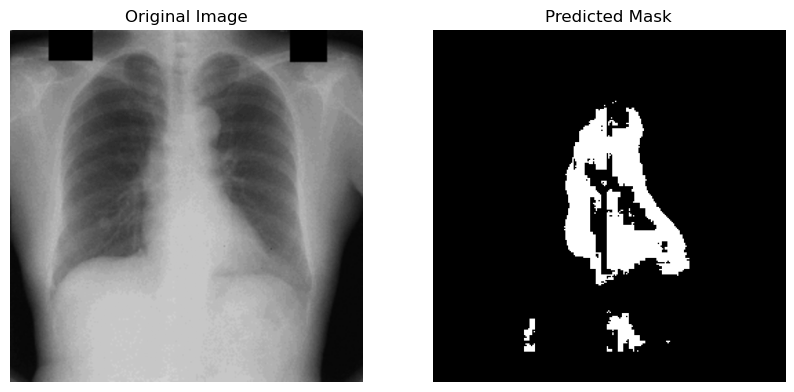

1/1 ━━━━━━━━━━━━━━━━━━━━ 5s 5s/step


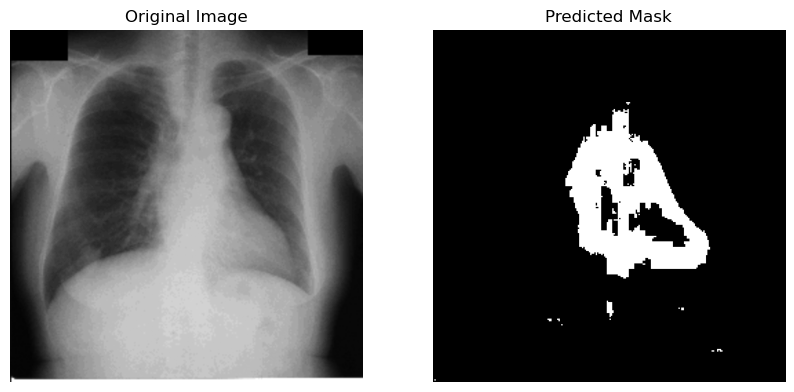

1/1 ━━━━━━━━━━━━━━━━━━━━ 4s 4s/step


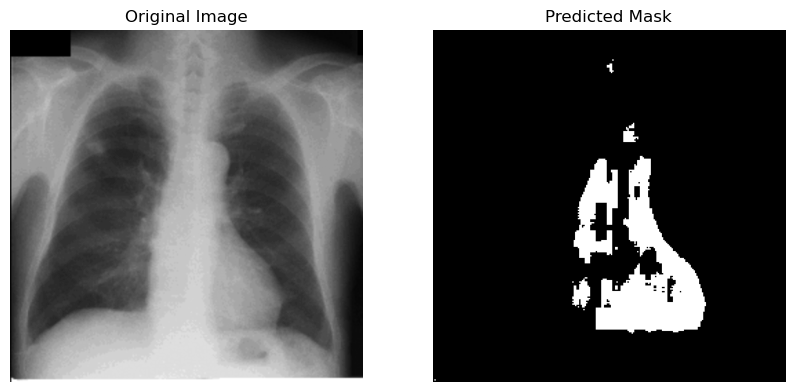

1/1 ━━━━━━━━━━━━━━━━━━━━ 4s 4s/step


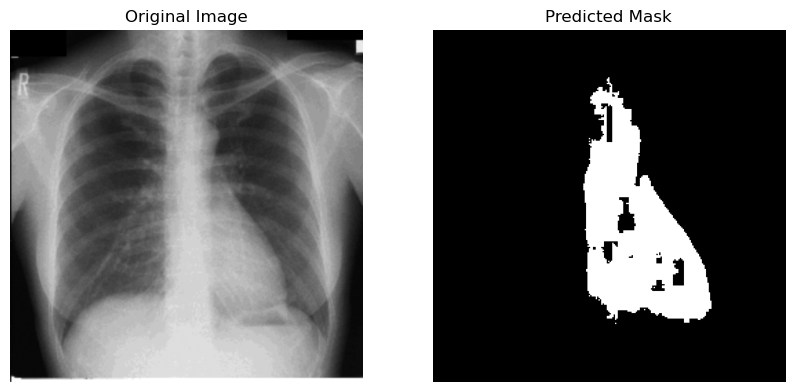

1/1 ━━━━━━━━━━━━━━━━━━━━ 5s 5s/step


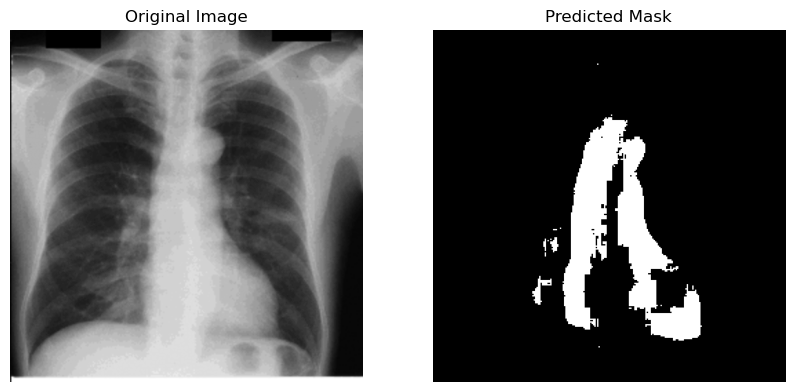

1/1 ━━━━━━━━━━━━━━━━━━━━ 5s 5s/step


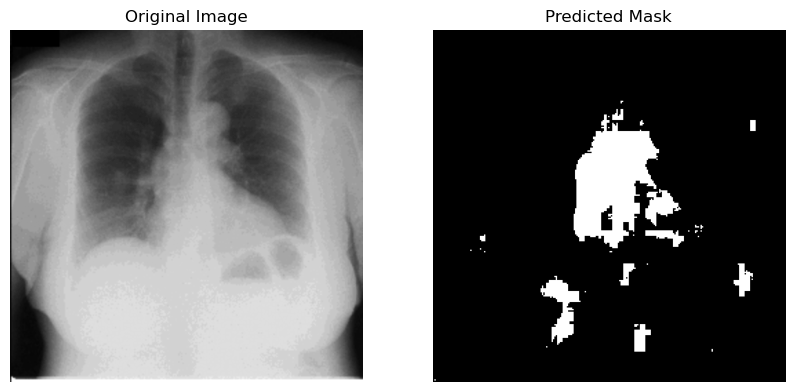

1/1 ━━━━━━━━━━━━━━━━━━━━ 4s 4s/step


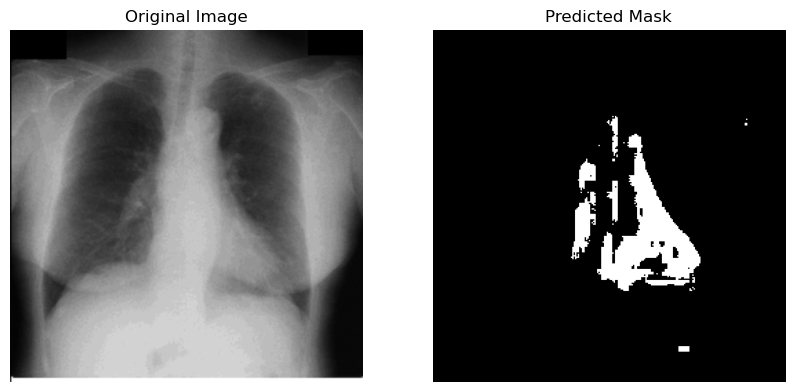

1/1 ━━━━━━━━━━━━━━━━━━━━ 4s 4s/step


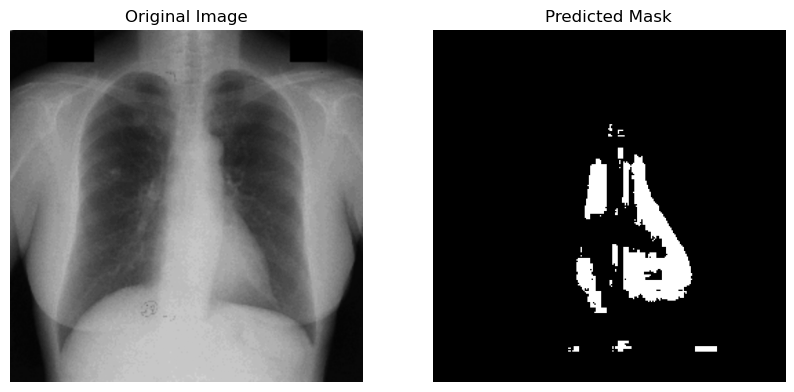

1/1 ━━━━━━━━━━━━━━━━━━━━ 5s 5s/step


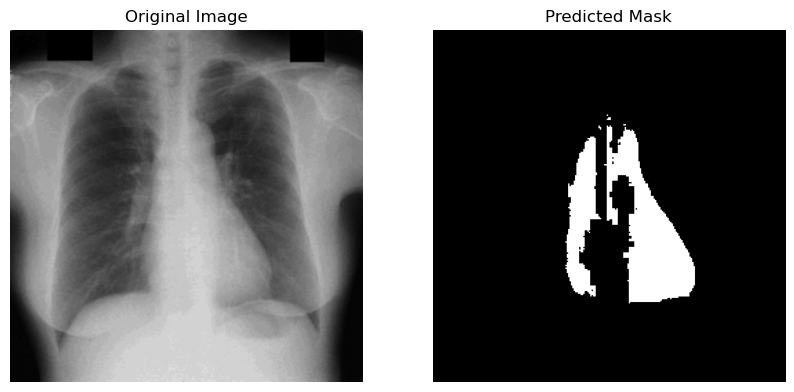

1/1 ━━━━━━━━━━━━━━━━━━━━ 4s 4s/step


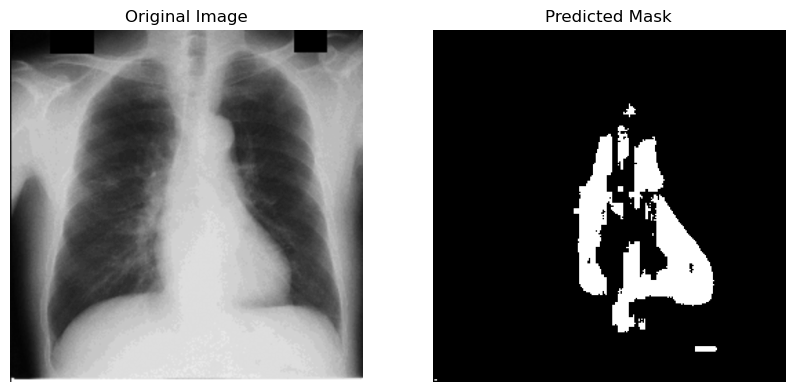

1/1 ━━━━━━━━━━━━━━━━━━━━ 4s 4s/step


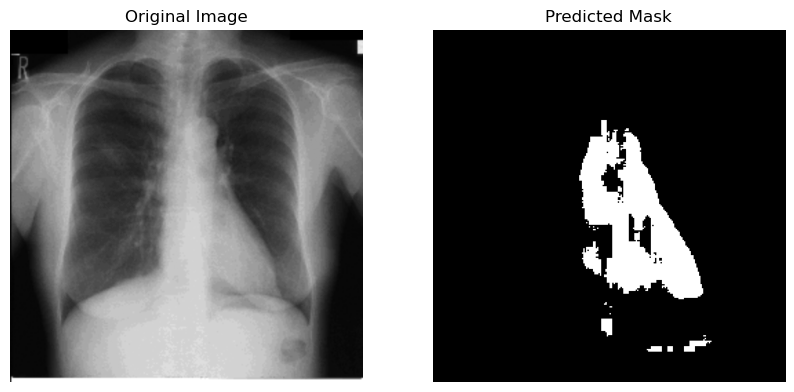

1/1 ━━━━━━━━━━━━━━━━━━━━ 4s 4s/step


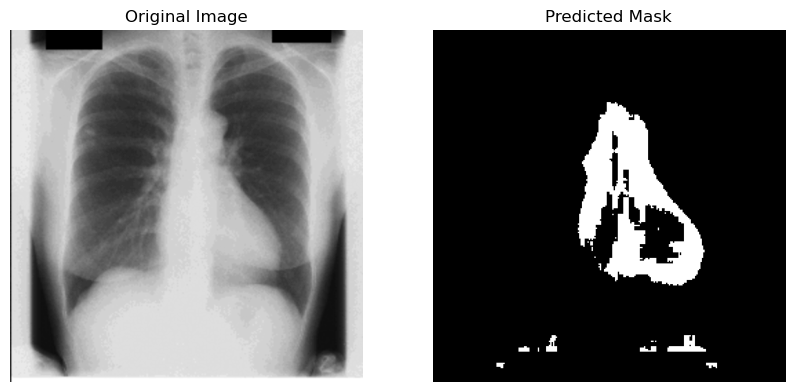

1/1 ━━━━━━━━━━━━━━━━━━━━ 4s 4s/step


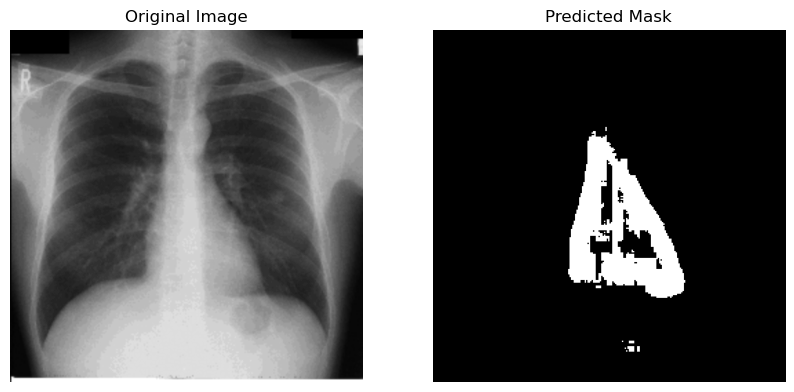

1/1 ━━━━━━━━━━━━━━━━━━━━ 5s 5s/step


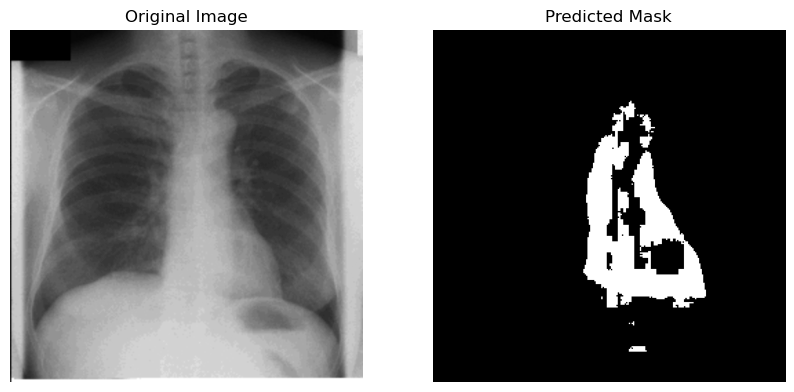

1/1 ━━━━━━━━━━━━━━━━━━━━ 4s 4s/step


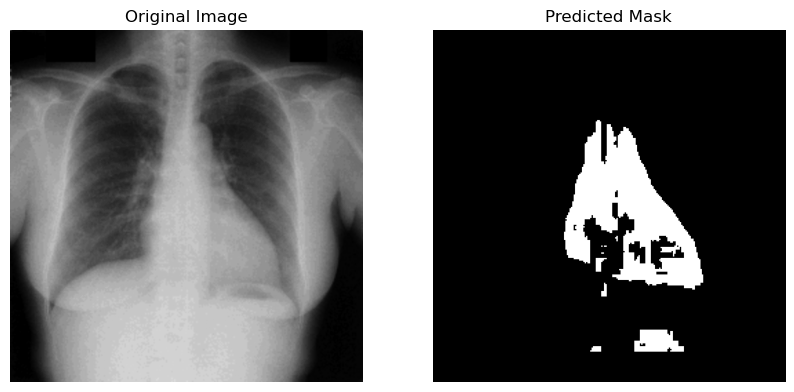

1/1 ━━━━━━━━━━━━━━━━━━━━ 5s 5s/step


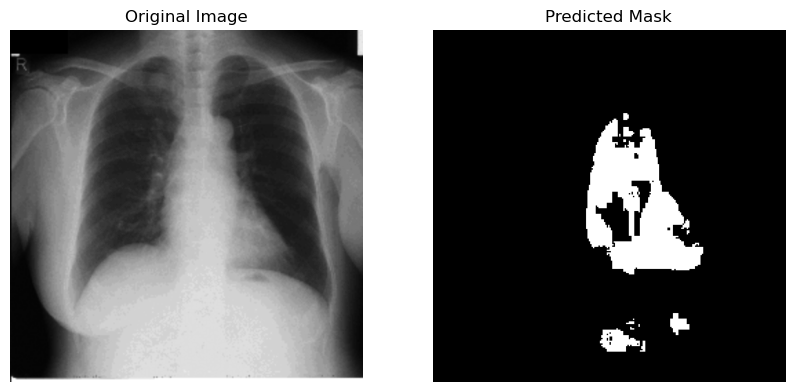

1/1 ━━━━━━━━━━━━━━━━━━━━ 4s 4s/step


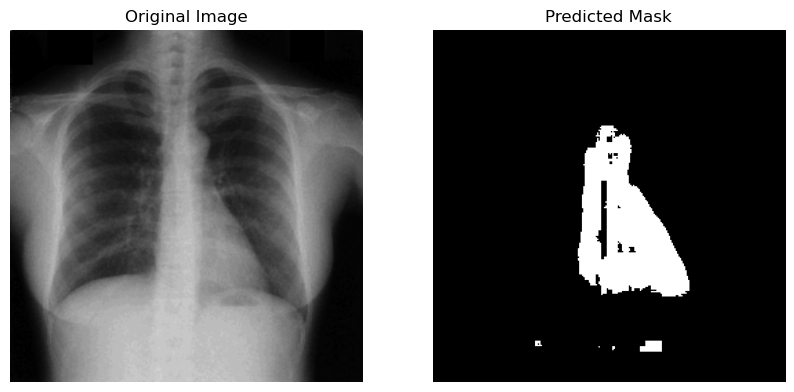

1/1 ━━━━━━━━━━━━━━━━━━━━ 5s 5s/step


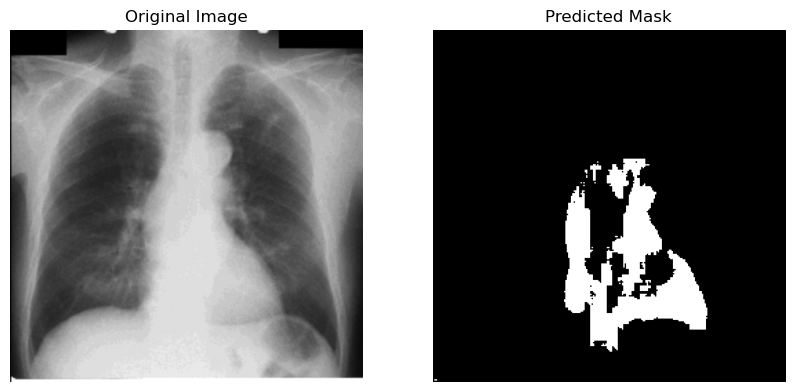

1/1 ━━━━━━━━━━━━━━━━━━━━ 5s 5s/step


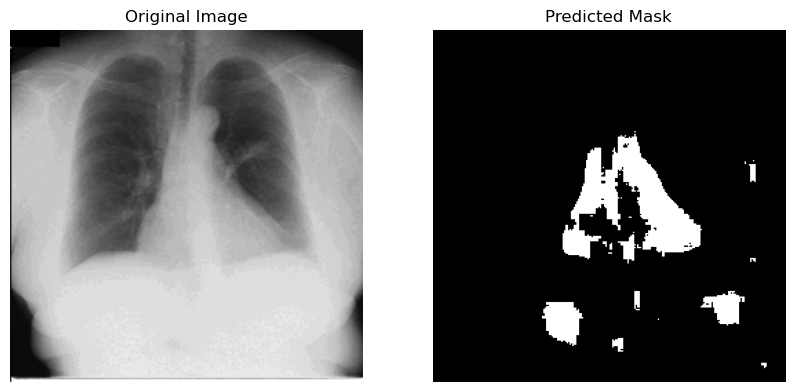

1/1 ━━━━━━━━━━━━━━━━━━━━ 4s 4s/step


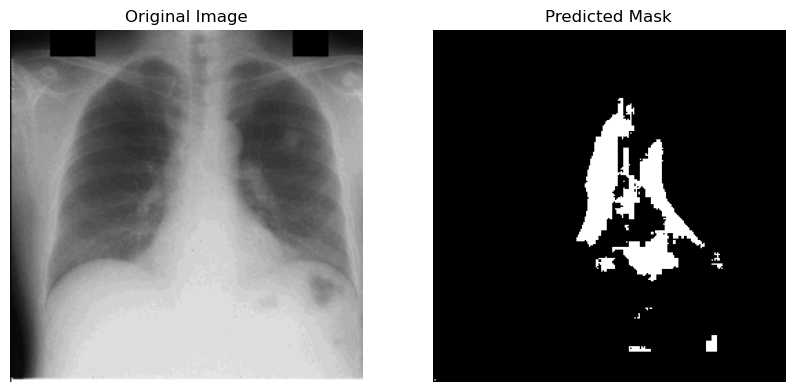

1/1 ━━━━━━━━━━━━━━━━━━━━ 4s 4s/step


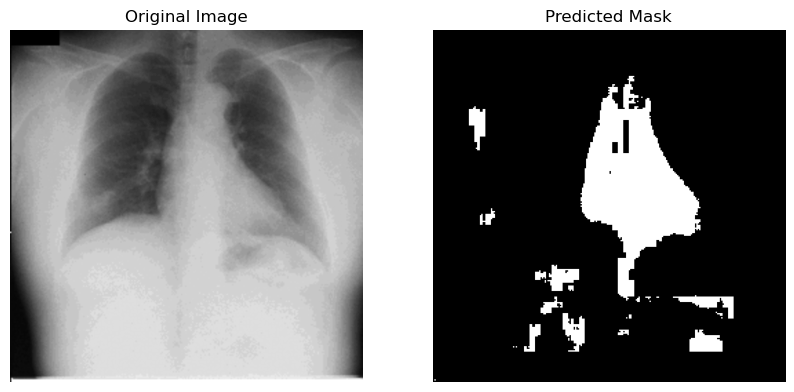

1/1 ━━━━━━━━━━━━━━━━━━━━ 5s 5s/step


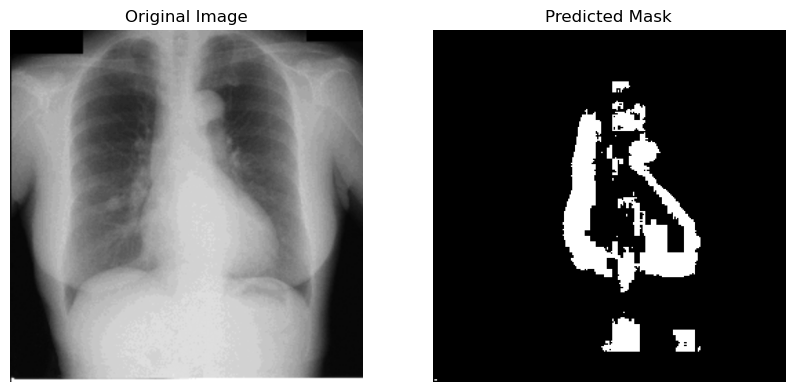

1/1 ━━━━━━━━━━━━━━━━━━━━ 4s 4s/step


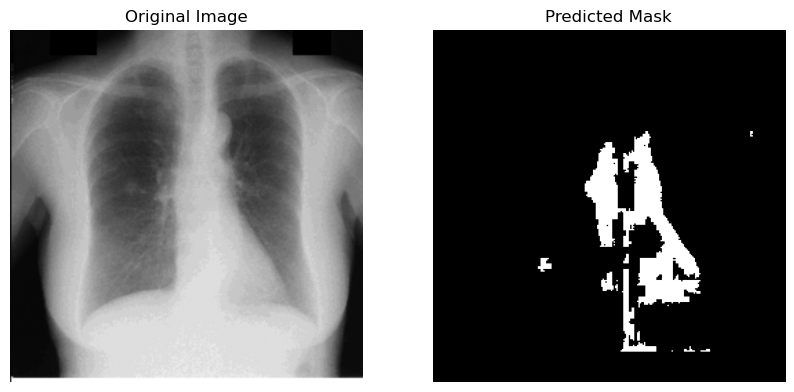

1/1 ━━━━━━━━━━━━━━━━━━━━ 4s 4s/step


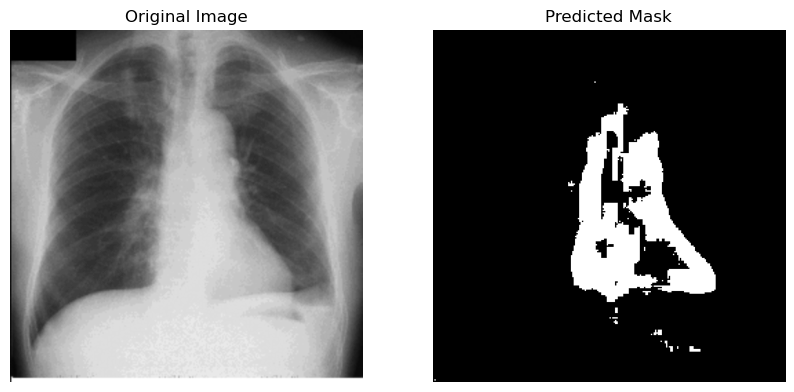

1/1 ━━━━━━━━━━━━━━━━━━━━ 5s 5s/step


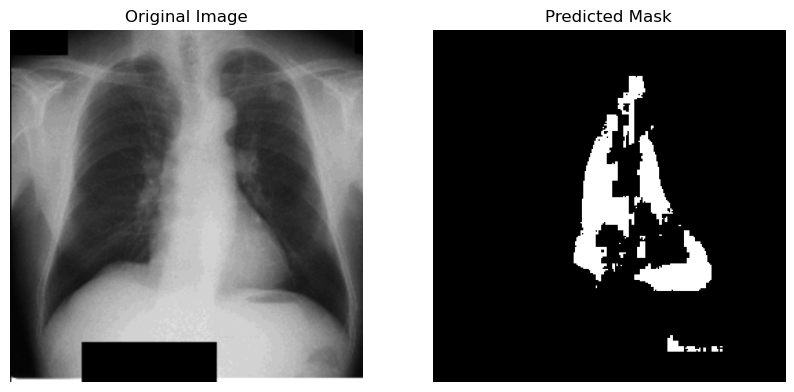

1/1 ━━━━━━━━━━━━━━━━━━━━ 4s 4s/step


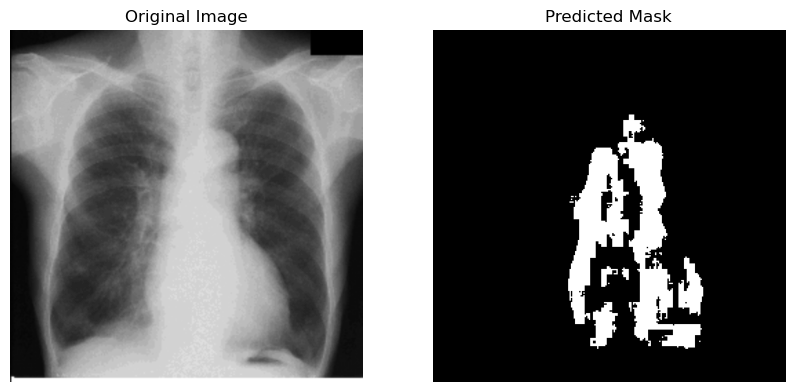

1/1 ━━━━━━━━━━━━━━━━━━━━ 5s 5s/step


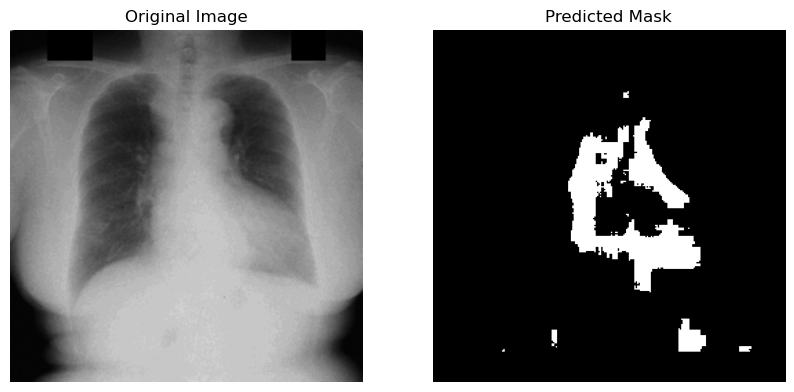

In [ ]:
import os
import numpy as np
import tensorflow as tf
import cv2
import matplotlib.pyplot as plt

# Load the trained model
model_path = r"C:\Users\DELL.COM\Desktop\Ephraim files\CTR_UNet_Model.keras"
model = tf.keras.models.load_model(model_path)

# Directory containing test images
test_images_dir = r"C:\Users\DELL.COM\Desktop\Ephraim files\Segmentation01\train\org"

# Function to preprocess images for the model
# Function to preprocess images for the model
def preprocess_image(image_path, target_size=(256, 256)):  # Change target size to 256x256
    img = cv2.imread(image_path, cv2.IMREAD_GRAYSCALE)  # Read in grayscale
    img = cv2.resize(img, target_size)  # Resize to model's input size
    img = img / 255.0  # Normalize
    img = np.expand_dims(img, axis=-1)  # Add channel dimension
    img = np.expand_dims(img, axis=0)  # Add batch dimension
    return img


# Get list of test images
test_images = [f for f in os.listdir(test_images_dir) if f.endswith(('.png', '.jpg', '.jpeg'))]

# Run inference and visualize results
for image_name in test_images:
    image_path = os.path.join(test_images_dir, image_name)
    input_image = preprocess_image(image_path)
    
    # Get model prediction
    predicted_mask = model.predict(input_image)[0]  # Remove batch dimension
    predicted_mask = (predicted_mask > 0.5).astype(np.uint8)  # Apply threshold
    
    # Read original image for display
    original_img = cv2.imread(image_path, cv2.IMREAD_GRAYSCALE)
    original_img = cv2.resize(original_img, (512, 512))

    # Display the original image and predicted mask side by side
    plt.figure(figsize=(10, 5))
    plt.subplot(1, 2, 1)
    plt.imshow(original_img, cmap='gray')
    plt.title("Original Image")
    plt.axis("off")

    plt.subplot(1, 2, 2)
    plt.imshow(predicted_mask, cmap='gray')
    plt.title("Predicted Mask")
    plt.axis("off")

    plt.show()


In [ ]:
import os
import numpy as np
import tensorflow as tf
from tensorflow.keras import layers, models
from tensorflow.keras.callbacks import ModelCheckpoint, ReduceLROnPlateau
from sklearn.model_selection import train_test_split

# Define directories for lung images and masks
original_image_dir = r"C:\Users\DELL.COM\Desktop\Ephraim files\My CTR Data\Preprocessed_lungs"
original_mask_dir = r"C:\Users\DELL.COM\Desktop\Ephraim files\Lungs_Masks"
augmented_image_dir = r"C:\Users\DELL.COM\Desktop\Ephraim files\Augmented_Lungs"
augmented_mask_dir = r"C:\Users\DELL.COM\Desktop\Ephraim files\Augmented_Lungs_Masks"
model_save_path = r"C:\Users\DELL.COM\Desktop\Ephraim files\CTR_UNet_Lungs.keras"

# Function to load images and masks
def load_data(image_folder, mask_folder):
    image_paths = sorted([os.path.join(image_folder, f) for f in os.listdir(image_folder) if f.endswith('.png')])
    mask_paths = sorted([os.path.join(mask_folder, f) for f in os.listdir(mask_folder) if f.endswith('.png')])
    
    images = np.array([np.array(tf.keras.utils.load_img(path, target_size=(256, 256), color_mode="rgb")) / 255.0 for path in image_paths])
    masks = np.array([np.array(tf.keras.utils.load_img(path, target_size=(256, 256), color_mode="grayscale")) / 255.0 for path in mask_paths])
    
    return images, masks[..., np.newaxis]

# Load original and augmented data
print("📂 Loading original and augmented lung datasets...")
original_images, original_masks = load_data(original_image_dir, original_mask_dir)
augmented_images, augmented_masks = load_data(augmented_image_dir, augmented_mask_dir)

# Combine datasets
images = np.concatenate([original_images, augmented_images], axis=0)
masks = np.concatenate([original_masks, augmented_masks], axis=0)

# Split data into training and testing sets
X_train, X_test, y_train, y_test = train_test_split(images, masks, test_size=0.2, random_state=42)
print(f"✅ Data loaded: {len(X_train)} training, {len(X_test)} testing")

# 🔥 Standard U-Net Model
def unet_model(input_shape=(256, 256, 3)):
    inputs = layers.Input(shape=input_shape)

    # Encoder
    conv1 = layers.Conv2D(64, (3, 3), activation='relu', padding='same')(inputs)
    conv1 = layers.Conv2D(64, (3, 3), activation='relu', padding='same')(conv1)
    pool1 = layers.MaxPooling2D(pool_size=(2, 2))(conv1)

    conv2 = layers.Conv2D(128, (3, 3), activation='relu', padding='same')(pool1)
    conv2 = layers.Conv2D(128, (3, 3), activation='relu', padding='same')(conv2)
    pool2 = layers.MaxPooling2D(pool_size=(2, 2))(conv2)

    conv3 = layers.Conv2D(256, (3, 3), activation='relu', padding='same')(pool2)
    conv3 = layers.Conv2D(256, (3, 3), activation='relu', padding='same')(conv3)
    pool3 = layers.MaxPooling2D(pool_size=(2, 2))(conv3)

    conv4 = layers.Conv2D(512, (3, 3), activation='relu', padding='same')(pool3)
    conv4 = layers.Conv2D(512, (3, 3), activation='relu', padding='same')(conv4)
    pool4 = layers.MaxPooling2D(pool_size=(2, 2))(conv4)

    # Bottleneck
    conv5 = layers.Conv2D(1024, (3, 3), activation='relu', padding='same')(pool4)
    conv5 = layers.Conv2D(1024, (3, 3), activation='relu', padding='same')(conv5)

    # Decoder
    up6 = layers.Conv2DTranspose(512, (2, 2), strides=(2, 2), padding='same')(conv5)
    up6 = layers.concatenate([up6, conv4])
    conv6 = layers.Conv2D(512, (3, 3), activation='relu', padding='same')(up6)
    conv6 = layers.Conv2D(512, (3, 3), activation='relu', padding='same')(conv6)

    up7 = layers.Conv2DTranspose(256, (2, 2), strides=(2, 2), padding='same')(conv6)
    up7 = layers.concatenate([up7, conv3])
    conv7 = layers.Conv2D(256, (3, 3), activation='relu', padding='same')(up7)
    conv7 = layers.Conv2D(256, (3, 3), activation='relu', padding='same')(conv7)

    up8 = layers.Conv2DTranspose(128, (2, 2), strides=(2, 2), padding='same')(conv7)
    up8 = layers.concatenate([up8, conv2])
    conv8 = layers.Conv2D(128, (3, 3), activation='relu', padding='same')(up8)
    conv8 = layers.Conv2D(128, (3, 3), activation='relu', padding='same')(conv8)

    up9 = layers.Conv2DTranspose(64, (2, 2), strides=(2, 2), padding='same')(conv8)
    up9 = layers.concatenate([up9, conv1])
    conv9 = layers.Conv2D(64, (3, 3), activation='relu', padding='same')(up9)
    conv9 = layers.Conv2D(64, (3, 3), activation='relu', padding='same')(conv9)

    outputs = layers.Conv2D(1, (1, 1), activation='sigmoid')(conv9)

    model = models.Model(inputs, outputs)
    return model

# Instantiate the U-Net model
print("🔥 Using Standard U-Net model for segmentation...")
unet = unet_model(input_shape=(256, 256, 3))

# Compile the model
print("🔧 Compiling model with Binary Crossentropy loss and MeanIoU metric...")
unet.compile(optimizer=tf.keras.optimizers.Adam(learning_rate=1e-4), 
             loss="binary_crossentropy", 
             metrics=[tf.keras.metrics.MeanIoU(num_classes=2)])

# Callbacks: Save best model & reduce learning rate if needed
checkpoint = ModelCheckpoint(model_save_path, save_best_only=True, monitor='val_loss', mode='min')
reduce_lr = ReduceLROnPlateau(monitor='val_loss', factor=0.5, patience=3, verbose=1, min_lr=1e-6)

# Train the model
batch_size = 8
epochs = 20  

print("🚀 Training Standard U-Net model for lung segmentation...")
history = unet.fit(
    X_train, y_train,
    validation_data=(X_test, y_test),
    batch_size=batch_size,
    epochs=epochs,
    callbacks=[checkpoint, reduce_lr]
)

print(f"✅ Training Complete! Best model saved at {model_save_path}")


📂 Loading original and augmented lung datasets...
✅ Data loaded: 1804 training, 452 testing
🔥 Using Standard U-Net model for segmentation...
🔧 Compiling model with Binary Crossentropy loss and MeanIoU metric...
🚀 Training Standard U-Net model for lung segmentation...
Epoch 1/20
226/226 ━━━━━━━━━━━━━━━━━━━━ 12923s 57s/step - loss: 0.5899 - mean_io_u: 0.2965 - val_loss: 0.2542 - val_mean_io_u: 0.2920 - learning_rate: 1.0000e-04
Epoch 2/20
226/226 ━━━━━━━━━━━━━━━━━━━━ 12072s 53s/step - loss: 0.2266 - mean_io_u: 0.2976 - val_loss: 0.1583 - val_mean_io_u: 0.2920 - learning_rate: 1.0000e-04
Epoch 3/20
226/226 ━━━━━━━━━━━━━━━━━━━━ 12123s 54s/step - loss: 0.1521 - mean_io_u: 0.2984 - val_loss: 0.1260 - val_mean_io_u: 0.2920 - learning_rate: 1.0000e-04
Epoch 4/20
226/226 ━━━━━━━━━━━━━━━━━━━━ 12103s 54s/step - loss: 0.1172 - mean_io_u: 0.2970 - val_loss: 0.1077 - val_mean_io_u: 0.2920 - learning_rate: 1.0000e-04
Epoch 5/20
226/226 ━━━━━━━━━━━━━━━━━━━━ 12074s 53s/step - loss: 0.0994 - mean_io_u: 

14/14 ━━━━━━━━━━━━━━━━━━━━ 698s 51s/step
✅ Model Evaluation Metrics
Accuracy: 0.7118
Sensitivity (Recall): 0.8852
Specificity: 0.6905
Precision: 0.2596
F1 Score: 0.4015
AUC-ROC: 0.7879


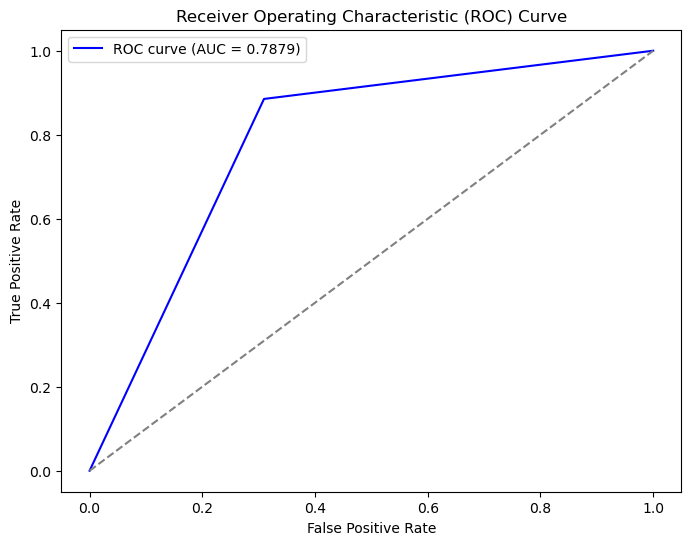

In [17]:
import numpy as np
import tensorflow as tf
from sklearn.metrics import classification_report, roc_curve, auc, confusion_matrix
import matplotlib.pyplot as plt

# Load the trained model
model_path = r"C:\Users\DELL.COM\Desktop\Ephraim files\CTR_UNet_Lungs.keras"

# Custom Dice Loss function (ensure consistency with the training script)
def dice_loss(y_true, y_pred):
    smooth = 1.0
    y_true_f = tf.keras.backend.flatten(y_true)
    y_pred_f = tf.keras.backend.flatten(y_pred)
    intersection = tf.keras.backend.sum(y_true_f * y_pred_f)
    return 1 - (2. * intersection + smooth) / (tf.keras.backend.sum(y_true_f) + tf.keras.backend.sum(y_pred_f) + smooth)

# Load model with custom loss
model = tf.keras.models.load_model(model_path, custom_objects={'dice_loss': dice_loss})

# Ensure X_test is in RGB format (if originally grayscale)
if X_test.shape[-1] == 1:
    X_test = np.repeat(X_test, 3, axis=-1)  # Convert (256, 256, 1) → (256, 256, 3)

# Make predictions
y_pred = model.predict(X_test)
y_pred_binary = (y_pred > 0.5).astype(np.uint8)  # Convert probabilities to binary (0 or 1)

# Flatten the arrays for sklearn metrics
y_test_flat = y_test.flatten()
y_pred_flat = y_pred_binary.flatten()

# Compute confusion matrix
tn, fp, fn, tp = confusion_matrix(y_test_flat, y_pred_flat).ravel()

# Compute evaluation metrics
accuracy = (tp + tn) / (tp + tn + fp + fn)
sensitivity = tp / (tp + fn)  # Recall
specificity = tn / (tn + fp)
precision = tp / (tp + fp)
f1 = 2 * (precision * sensitivity) / (precision + sensitivity)

# ROC Curve
fpr, tpr, _ = roc_curve(y_test_flat, y_pred_flat)
roc_auc = auc(fpr, tpr)

# Print evaluation results
print("✅ Model Evaluation Metrics")
print(f"Accuracy: {accuracy:.4f}")
print(f"Sensitivity (Recall): {sensitivity:.4f}")
print(f"Specificity: {specificity:.4f}")
print(f"Precision: {precision:.4f}")
print(f"F1 Score: {f1:.4f}")
print(f"AUC-ROC: {roc_auc:.4f}")

# Plot ROC Curve
plt.figure(figsize=(8, 6))
plt.plot(fpr, tpr, color='blue', label=f'ROC curve (AUC = {roc_auc:.4f})')
plt.plot([0, 1], [0, 1], color='gray', linestyle='--')
plt.xlabel('False Positive Rate')
plt.ylabel('True Positive Rate')
plt.title('Receiver Operating Characteristic (ROC) Curve')
plt.legend()
plt.show()


In [ ]:
import os
import numpy as np
import tensorflow as tf
from tensorflow.keras import layers, models
from tensorflow.keras.callbacks import ModelCheckpoint, ReduceLROnPlateau, EarlyStopping
from sklearn.model_selection import train_test_split

# Define directories for lung images and masks
original_image_dir = r"C:\Users\DELL.COM\Desktop\Ephraim files\My CTR Data\Preprocessed_lungs"
original_mask_dir = r"C:\Users\DELL.COM\Desktop\Ephraim files\Lungs_Masks"
augmented_image_dir = r"C:\Users\DELL.COM\Desktop\Ephraim files\Augmented_Lungs"
augmented_mask_dir = r"C:\Users\DELL.COM\Desktop\Ephraim files\Augmented_Lungs_Masks"
model_save_path = r"C:\Users\DELL.COM\Desktop\Ephraim files\CTR_UNet_Luuuungs_precision.keras"

# Function to load images and masks
def load_data(image_folder, mask_folder):
    image_paths = sorted([os.path.join(image_folder, f) for f in os.listdir(image_folder) if f.endswith('.png')])
    mask_paths = sorted([os.path.join(mask_folder, f) for f in os.listdir(mask_folder) if f.endswith('.png')])
    
    images = np.array([np.array(tf.keras.utils.load_img(path, target_size=(256, 256), color_mode="rgb")) / 255.0 for path in image_paths])
    masks = np.array([np.array(tf.keras.utils.load_img(path, target_size=(256, 256), color_mode="grayscale")) / 255.0 for path in mask_paths])
    
    return images, masks[..., np.newaxis]

# Load original and augmented data
print("📂 Loading original and augmented lung datasets...")
original_images, original_masks = load_data(original_image_dir, original_mask_dir)
augmented_images, augmented_masks = load_data(augmented_image_dir, augmented_mask_dir)

# Combine datasets
images = np.concatenate([original_images, augmented_images], axis=0)
masks = np.concatenate([original_masks, augmented_masks], axis=0)

# Split data into training and testing sets
X_train, X_test, y_train, y_test = train_test_split(images, masks, test_size=0.2, random_state=42)
print(f"✅ Data loaded: {len(X_train)} training, {len(X_test)} testing")

# 🔥 Optimized U-Net Model
def unet_model(input_shape=(256, 256, 3)):
    inputs = layers.Input(shape=input_shape)

    # Encoder
    def conv_block(x, filters):
        x = layers.Conv2D(filters, (3, 3), activation='relu', padding='same')(x)
        x = layers.BatchNormalization()(x)
        x = layers.Conv2D(filters, (3, 3), activation='relu', padding='same')(x)
        x = layers.BatchNormalization()(x)
        return x

    def upconv_block(x, skip, filters):
        x = layers.Conv2DTranspose(filters, (2, 2), strides=(2, 2), padding='same')(x)
        x = layers.concatenate([x, skip])
        x = conv_block(x, filters)
        return x

    conv1 = conv_block(inputs, 64)
    pool1 = layers.MaxPooling2D(pool_size=(2, 2))(conv1)

    conv2 = conv_block(pool1, 128)
    pool2 = layers.MaxPooling2D(pool_size=(2, 2))(conv2)

    conv3 = conv_block(pool2, 256)
    pool3 = layers.MaxPooling2D(pool_size=(2, 2))(conv3)

    conv4 = conv_block(pool3, 512)
    pool4 = layers.MaxPooling2D(pool_size=(2, 2))(conv4)

    # Bottleneck
    conv5 = conv_block(pool4, 1024)

    # Decoder
    up6 = upconv_block(conv5, conv4, 512)
    up7 = upconv_block(up6, conv3, 256)
    up8 = upconv_block(up7, conv2, 128)
    up9 = upconv_block(up8, conv1, 64)

    outputs = layers.Conv2D(1, (1, 1), activation='sigmoid')(up9)

    model = models.Model(inputs, outputs)
    return model

# Instantiate the U-Net model
print("🔥 Using Optimized U-Net model for segmentation...")
unet = unet_model(input_shape=(256, 256, 3))

# Custom Dice Loss function (Optional, improves segmentation)
def dice_loss(y_true, y_pred):
    smooth = 1.0
    y_true_f = tf.keras.backend.flatten(y_true)
    y_pred_f = tf.keras.backend.flatten(y_pred)
    intersection = tf.keras.backend.sum(y_true_f * y_pred_f)
    return 1 - (2. * intersection + smooth) / (tf.keras.backend.sum(y_true_f) + tf.keras.backend.sum(y_pred_f) + smooth)

# Compile the model
print("🔧 Compiling model with Dice Loss and Precision metric...")
unet.compile(optimizer=tf.keras.optimizers.Adam(learning_rate=1e-4), 
             loss=dice_loss,  # Use Binary Crossentropy if you prefer: "binary_crossentropy"
             metrics=[tf.keras.metrics.Precision()])  # Tracks Precision instead of IoU

# Callbacks: Save best model & reduce learning rate if needed
checkpoint = ModelCheckpoint(model_save_path, save_best_only=True, monitor='val_loss', mode='min')
reduce_lr = ReduceLROnPlateau(monitor='val_loss', factor=0.5, patience=3, verbose=1, min_lr=1e-6)
early_stopping = EarlyStopping(monitor='val_loss', patience=5, restore_best_weights=True)

# Train the model
batch_size = 8
epochs = 20  

print("🚀 Training Optimized U-Net model for lung segmentation...")
history = unet.fit(
    X_train, y_train,
    validation_data=(X_test, y_test),
    batch_size=batch_size,
    epochs=epochs,
    callbacks=[checkpoint, reduce_lr, early_stopping]  # Stops training when no improvement
)

print(f"✅ Training Complete! Best model saved at {model_save_path}")


📂 Loading original and augmented lung datasets...
✅ Data loaded: 1804 training, 452 testing
🔥 Using Optimized U-Net model for segmentation...
🔧 Compiling model with Dice Loss and Precision metric...
🚀 Training Optimized U-Net model for lung segmentation...
Epoch 1/20
226/226 ━━━━━━━━━━━━━━━━━━━━ 13368s 59s/step - loss: 0.2036 - precision: 0.7696 - val_loss: 0.9880 - val_precision: 0.8606 - learning_rate: 1.0000e-04
Epoch 2/20
226/226 ━━━━━━━━━━━━━━━━━━━━ 13032s 58s/step - loss: 0.0492 - precision: 0.9549 - val_loss: 0.1557 - val_precision: 0.9732 - learning_rate: 1.0000e-04
Epoch 3/20
226/226 ━━━━━━━━━━━━━━━━━━━━ 13050s 58s/step - loss: 0.0389 - precision: 0.9634 - val_loss: 0.0584 - val_precision: 0.9751 - learning_rate: 1.0000e-04
Epoch 4/20
226/226 ━━━━━━━━━━━━━━━━━━━━ 13070s 58s/step - loss: 0.0358 - precision: 0.9667 - val_loss: 0.0362 - val_precision: 0.9624 - learning_rate: 1.0000e-04
Epoch 5/20
226/226 ━━━━━━━━━━━━━━━━━━━━ 13052s 58s/step - loss: 0.0326 - precision: 0.9707 - va

14/14 ━━━━━━━━━━━━━━━━━━━━ 545s 36s/step
✅ Model Evaluation Metrics
Accuracy: 0.7194
Sensitivity (Recall): 0.8903
Specificity: 0.6985
Precision: 0.2658
F1 Score: 0.4093
AUC-ROC: 0.7944


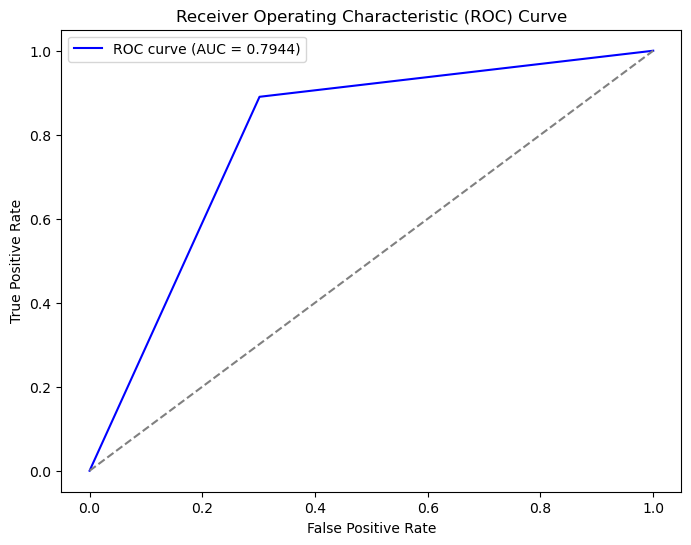

In [16]:
import numpy as np
import tensorflow as tf
from sklearn.metrics import classification_report, roc_curve, auc, confusion_matrix
import matplotlib.pyplot as plt

# Load the trained model
model_path = r"C:\Users\DELL.COM\Desktop\Ephraim files\CTR_UNet_Luuuungs_precision.keras"

# Custom Dice Loss function (ensure consistency with the training script)
def dice_loss(y_true, y_pred):
    smooth = 1.0
    y_true_f = tf.keras.backend.flatten(y_true)
    y_pred_f = tf.keras.backend.flatten(y_pred)
    intersection = tf.keras.backend.sum(y_true_f * y_pred_f)
    return 1 - (2. * intersection + smooth) / (tf.keras.backend.sum(y_true_f) + tf.keras.backend.sum(y_pred_f) + smooth)

# Load model with custom loss
model = tf.keras.models.load_model(model_path, custom_objects={'dice_loss': dice_loss})

# Ensure X_test is in RGB format (if originally grayscale)
if X_test.shape[-1] == 1:
    X_test = np.repeat(X_test, 3, axis=-1)  # Convert (256, 256, 1) → (256, 256, 3)

# Make predictions
y_pred = model.predict(X_test)
y_pred_binary = (y_pred > 0.5).astype(np.uint8)  # Convert probabilities to binary (0 or 1)

# Flatten the arrays for sklearn metrics
y_test_flat = y_test.flatten()
y_pred_flat = y_pred_binary.flatten()

# Compute confusion matrix
tn, fp, fn, tp = confusion_matrix(y_test_flat, y_pred_flat).ravel()

# Compute evaluation metrics
accuracy = (tp + tn) / (tp + tn + fp + fn)
sensitivity = tp / (tp + fn)  # Recall
specificity = tn / (tn + fp)
precision = tp / (tp + fp)
f1 = 2 * (precision * sensitivity) / (precision + sensitivity)

# ROC Curve
fpr, tpr, _ = roc_curve(y_test_flat, y_pred_flat)
roc_auc = auc(fpr, tpr)

# Print evaluation results
print("✅ Model Evaluation Metrics")
print(f"Accuracy: {accuracy:.4f}")
print(f"Sensitivity (Recall): {sensitivity:.4f}")
print(f"Specificity: {specificity:.4f}")
print(f"Precision: {precision:.4f}")
print(f"F1 Score: {f1:.4f}")
print(f"AUC-ROC: {roc_auc:.4f}")

# Plot ROC Curve
plt.figure(figsize=(8, 6))
plt.plot(fpr, tpr, color='blue', label=f'ROC curve (AUC = {roc_auc:.4f})')
plt.plot([0, 1], [0, 1], color='gray', linestyle='--')
plt.xlabel('False Positive Rate')
plt.ylabel('True Positive Rate')
plt.title('Receiver Operating Characteristic (ROC) Curve')
plt.legend()
plt.show()


In [7]:
import os
import cv2
import numpy as np
import tensorflow as tf

# Paths
MODEL_PATH = r"C:\Users\DELL.COM\Desktop\Ephraim files\CTR_UNet_Luuuungs_precision.keras"
IMAGE_FOLDER = r"C:\Users\DELL.COM\Desktop\Ephraim files\New data CTR"
SAVE_PATH = r"C:\Users\DELL.COM\Desktop\Ephraim files\Segmented_Masks\seg_new_model"

# Create the output folder if it doesn't exist
os.makedirs(SAVE_PATH, exist_ok=True)

# Load trained model
model = tf.keras.models.load_model(MODEL_PATH)

# Image size expected by model
IMG_SIZE = (256, 256)  # Update if different

def load_image(image_path):
    """Load image, resize to match model input, and convert to 3-channel."""
    img = cv2.imread(image_path, cv2.IMREAD_GRAYSCALE)  # Load grayscale
    img = cv2.resize(img, IMG_SIZE)  # Resize to model's input size
    img = np.stack([img] * 3, axis=-1)  # Convert grayscale to 3-channel RGB
    img = img / 255.0  # Normalize to [0,1]
    return img

# Process all images in folder
for filename in os.listdir(IMAGE_FOLDER):
    img_path = os.path.join(IMAGE_FOLDER, filename)
    
    # Ensure it's an image file
    if not filename.lower().endswith((".png", ".jpg", ".jpeg")):
        continue

    # Load image
    img = load_image(img_path)

    # Prepare for prediction
    img_input = np.expand_dims(img, axis=0)  # Add batch dimension
    predicted_mask = model.predict(img_input)[0]  # Predict mask
    predicted_mask = (predicted_mask > 0.5).astype(np.uint8) * 255  # Threshold & convert to binary mask

    # Save predicted mask
    save_mask_path = os.path.join(SAVE_PATH, filename)
    cv2.imwrite(save_mask_path, predicted_mask)

    print(f"Saved mask: {save_mask_path}")

print("✅ Segmentation complete. All masks saved!")


1/1 ━━━━━━━━━━━━━━━━━━━━ 16s 16s/step
Saved mask: C:\Users\DELL.COM\Desktop\Ephraim files\Segmented_Masks\seg_new_model\C001.png
1/1 ━━━━━━━━━━━━━━━━━━━━ 11s 11s/step
Saved mask: C:\Users\DELL.COM\Desktop\Ephraim files\Segmented_Masks\seg_new_model\C002.png
1/1 ━━━━━━━━━━━━━━━━━━━━ 11s 11s/step
Saved mask: C:\Users\DELL.COM\Desktop\Ephraim files\Segmented_Masks\seg_new_model\C003.png
1/1 ━━━━━━━━━━━━━━━━━━━━ 10s 10s/step
Saved mask: C:\Users\DELL.COM\Desktop\Ephraim files\Segmented_Masks\seg_new_model\C004.png
1/1 ━━━━━━━━━━━━━━━━━━━━ 11s 11s/step
Saved mask: C:\Users\DELL.COM\Desktop\Ephraim files\Segmented_Masks\seg_new_model\C005.png
1/1 ━━━━━━━━━━━━━━━━━━━━ 12s 12s/step
Saved mask: C:\Users\DELL.COM\Desktop\Ephraim files\Segmented_Masks\seg_new_model\C006.png
1/1 ━━━━━━━━━━━━━━━━━━━━ 11s 11s/step
Saved mask: C:\Users\DELL.COM\Desktop\Ephraim files\Segmented_Masks\seg_new_model\C007.png
1/1 ━━━━━━━━━━━━━━━━━━━━ 11s 11s/step
Saved mask: C:\Users\DELL.COM\Desktop\Ephraim files\Segment

In [12]:
import os
import cv2
import numpy as np
import albumentations as A
from tqdm import tqdm

# Define directories
image_dir = r"C:\Users\DELL.COM\Desktop\Ephraim files\New data CTR"
mask_dir = r"C:\Users\DELL.COM\Desktop\Ephraim files\New data CTR\masks"

# Output directories
augmented_image_dir = r"C:\Users\DELL.COM\Desktop\Ephraim files\New data CTR\Augmented_Heart"
augmented_mask_dir = r"C:\Users\DELL.COM\Desktop\Ephraim files\New data CTR\Augmented_Heart_Masks"

# Create directories if they do not exist
os.makedirs(augmented_image_dir, exist_ok=True)
os.makedirs(augmented_mask_dir, exist_ok=True)

# Number of augmented images per original image
num_augmentations = 5  

# Define augmentations
augmentations = A.Compose([
    A.ElasticTransform(alpha=1, sigma=50, p=0.7),  
    A.GaussNoise(p=0.7),  # Fixed argument issue
    A.RandomBrightnessContrast(brightness_limit=0.2, contrast_limit=0.2, p=0.7),  
    A.GridDistortion(num_steps=5, distort_limit=0.3, p=0.7),  
    A.RandomGamma(gamma_limit=(80, 120), p=0.7),  
    A.Resize(height=512, width=512, p=1.0)  
], additional_targets={'mask': 'image'})  

# Get valid image files
valid_extensions = (".png", ".jpg", ".jpeg")
image_files = [f for f in os.listdir(image_dir) if f.lower().endswith(valid_extensions)]

# Process all images
for img_name in tqdm(image_files, desc="Augmenting Images"):
    img_path = os.path.join(image_dir, img_name)
    mask_path = os.path.join(mask_dir, img_name)

    if not os.path.exists(mask_path):
        print(f"Skipping {img_name}, no matching mask found.")
        continue

    # Read image and mask
    image = cv2.imread(img_path)  
    mask = cv2.imread(mask_path, cv2.IMREAD_GRAYSCALE)  

    if image is None or mask is None:
        print(f"Error reading {img_name}, skipping...")
        continue

    # Expand grayscale mask to 3-channel for augmentation
    mask = np.stack([mask] * 3, axis=-1)  

    for i in range(num_augmentations):  
        augmented = augmentations(image=image, mask=mask)
        aug_img, aug_mask = augmented["image"], augmented["mask"]

        # Convert mask back to grayscale
        aug_mask = cv2.cvtColor(aug_mask, cv2.COLOR_BGR2GRAY)

        # Ensure mask remains binary (0 or 255)
        aug_mask = (aug_mask > 127).astype(np.uint8) * 255  

        # Save augmented image & mask
        cv2.imwrite(os.path.join(augmented_image_dir, f"aug_{i}_{img_name}"), aug_img)
        cv2.imwrite(os.path.join(augmented_mask_dir, f"aug_{i}_{img_name}"), aug_mask)

print("✅ Augmentation Complete! Check Augmented_Heart & Augmented_Heart_Masks.")


Augmenting Images: 100%|██████████| 352/352 [09:36<00:00,  1.64s/it]

✅ Augmentation Complete! Check Augmented_Heart & Augmented_Heart_Masks.


In [13]:
import os
import numpy as np
import tensorflow as tf
from tensorflow.keras.callbacks import ModelCheckpoint
from sklearn.model_selection import train_test_split

# Define directories
original_image_dir = r"C:\Users\DELL.COM\Desktop\Ephraim files\New data CTR"
original_mask_dir = r"C:\Users\DELL.COM\Desktop\Ephraim files\New data CTR\masks"
augmented_image_dir = r"C:\Users\DELL.COM\Desktop\Ephraim files\New data CTR\Augmented_Heart"
augmented_mask_dir = r"C:\Users\DELL.COM\Desktop\Ephraim files\New data CTR\Augmented_Heart_Masks"
model_save_path = r"C:\Users\DELL.COM\Desktop\Ephraim files\CTR_UNet_FineTuned.keras"

# Function to load images and masks from a given folder
def load_data(image_folder, mask_folder):
    image_paths = sorted([os.path.join(image_folder, f) for f in os.listdir(image_folder) if f.endswith('.png')])
    mask_paths = sorted([os.path.join(mask_folder, f) for f in os.listdir(mask_folder) if f.endswith('.png')])
    
    images = np.array([np.array(tf.keras.utils.load_img(path, target_size=(256, 256), color_mode="grayscale")) / 255.0 for path in image_paths])
    masks = np.array([np.array(tf.keras.utils.load_img(path, target_size=(256, 256), color_mode="grayscale")) / 255.0 for path in mask_paths])
    
    return images[..., np.newaxis], masks[..., np.newaxis]

# Load original and augmented data
print("📂 Loading original and augmented datasets...")
original_images, original_masks = load_data(original_image_dir, original_mask_dir)
augmented_images, augmented_masks = load_data(augmented_image_dir, augmented_mask_dir)

# Combine both datasets
images = np.concatenate([original_images, augmented_images], axis=0)
masks = np.concatenate([original_masks, augmented_masks], axis=0)

# Split data into training and testing sets
X_train, X_test, y_train, y_test = train_test_split(images, masks, test_size=0.2, random_state=42)
print(f"✅ Data loaded: {len(X_train)} training, {len(X_test)} testing")

# Load the existing model
if os.path.exists(model_save_path):
    print("🔄 Loading pre-trained model for fine-tuning...")
    model = tf.keras.models.load_model(model_save_path)
else:
    raise FileNotFoundError("❌ No trained model found! Train a model first before fine-tuning.")

# OPTIONAL: Modify the final layer to focus only on heart segmentation
print("🔧 Adjusting the final output layer for heart segmentation...")
model.layers[-1] = tf.keras.layers.Conv2D(1, (1, 1), activation='sigmoid')  # Output 1 channel for heart-only mask

# Recompile model for fine-tuning
model.compile(optimizer=tf.keras.optimizers.Adam(learning_rate=1e-4), 
              loss='binary_crossentropy', 
              metrics=['accuracy'])

# Setup model checkpoint to save improvements
checkpoint = ModelCheckpoint(model_save_path, save_best_only=True, monitor='val_loss', mode='min')

# Fine-tune the model
batch_size = 8
epochs = 20  # Fine-tuning doesn't need too many epochs

print("🚀 Fine-tuning model for heart-only segmentation...")
history = model.fit(
    X_train, y_train,
    validation_data=(X_test, y_test),
    batch_size=batch_size,
    epochs=epochs,
    callbacks=[checkpoint]
)

print(f"✅ Fine-tuning Complete! Model saved at {model_save_path}")


📂 Loading original and augmented datasets...
✅ Data loaded: 1689 training, 423 testing
🔄 Loading pre-trained model for fine-tuning...
🔧 Adjusting the final output layer for heart segmentation...
🚀 Fine-tuning model for heart-only segmentation...
Epoch 1/20
212/212 ━━━━━━━━━━━━━━━━━━━━ 5834s 27s/step - accuracy: 0.9568 - loss: 0.1088 - val_accuracy: 0.9637 - val_loss: 0.0928
Epoch 2/20
212/212 ━━━━━━━━━━━━━━━━━━━━ 6397s 30s/step - accuracy: 0.9631 - loss: 0.0938 - val_accuracy: 0.9614 - val_loss: 0.0971
Epoch 3/20
212/212 ━━━━━━━━━━━━━━━━━━━━ 6207s 29s/step - accuracy: 0.9616 - loss: 0.0970 - val_accuracy: 0.9661 - val_loss: 0.0866
Epoch 4/20
212/212 ━━━━━━━━━━━━━━━━━━━━ 6228s 29s/step - accuracy: 0.9656 - loss: 0.0871 - val_accuracy: 0.9665 - val_loss: 0.0857
Epoch 5/20
212/212 ━━━━━━━━━━━━━━━━━━━━ 6122s 29s/step - accuracy: 0.9661 - loss: 0.0858 - val_accuracy: 0.9639 - val_loss: 0.0905
Epoch 6/20
212/212 ━━━━━━━━━━━━━━━━━━━━ 6090s 29s/step - accuracy: 0.9660 - loss: 0.0862 - val_accu

14/14 ━━━━━━━━━━━━━━━━━━━━ 311s 16s/step
✅ Model Evaluation Metrics
Accuracy: 0.9707
Sensitivity (Recall): 0.8376
Specificity: 0.9870
Precision: 0.8879
F1 Score: 0.8620
AUC-ROC: 0.9123


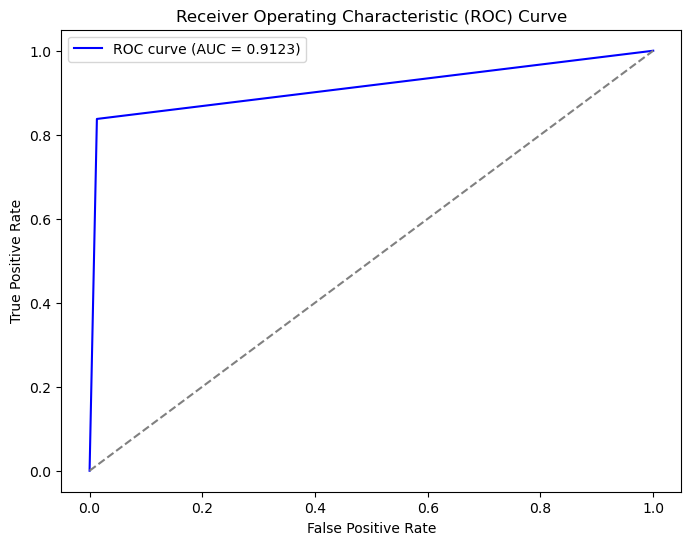

In [14]:
import numpy as np
import tensorflow as tf
from sklearn.metrics import classification_report, roc_curve, auc, confusion_matrix
import matplotlib.pyplot as plt

# Load test data
model_path = r"C:\Users\DELL.COM\Desktop\Ephraim files\CTR_UNet_FineTuned.keras"
model = tf.keras.models.load_model(model_path)

# Assuming X_test and y_test are already loaded (from your previous script)
y_pred = model.predict(X_test)
y_pred_binary = (y_pred > 0.5).astype(np.uint8)  # Convert probabilities to binary (0 or 1)

# Flatten the arrays for sklearn metrics
y_test_flat = y_test.flatten()
y_pred_flat = y_pred_binary.flatten()

# Calculate confusion matrix
tn, fp, fn, tp = confusion_matrix(y_test_flat, y_pred_flat).ravel()

# Compute metrics
accuracy = (tp + tn) / (tp + tn + fp + fn)
sensitivity = tp / (tp + fn)  # Recall
specificity = tn / (tn + fp)
precision = tp / (tp + fp)
f1 = 2 * (precision * sensitivity) / (precision + sensitivity)

# ROC Curve
fpr, tpr, _ = roc_curve(y_test_flat, y_pred_flat)
roc_auc = auc(fpr, tpr)

# Print classification report
print("✅ Model Evaluation Metrics")
print(f"Accuracy: {accuracy:.4f}")
print(f"Sensitivity (Recall): {sensitivity:.4f}")
print(f"Specificity: {specificity:.4f}")
print(f"Precision: {precision:.4f}")
print(f"F1 Score: {f1:.4f}")
print(f"AUC-ROC: {roc_auc:.4f}")

# Plot ROC Curve
plt.figure(figsize=(8, 6))
plt.plot(fpr, tpr, color='blue', label=f'ROC curve (AUC = {roc_auc:.4f})')
plt.plot([0, 1], [0, 1], color='gray', linestyle='--')
plt.xlabel('False Positive Rate')
plt.ylabel('True Positive Rate')
plt.title('Receiver Operating Characteristic (ROC) Curve')
plt.legend()
plt.show()


1/1 ━━━━━━━━━━━━━━━━━━━━ 35s 35s/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 12s 12s/step


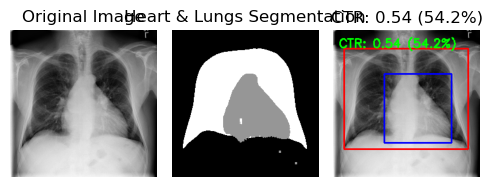

✅ Saved result for C001.png at C:\Users\DELL.COM\Desktop\Ephraim files\CTR_Results\result_C001.png
1/1 ━━━━━━━━━━━━━━━━━━━━ 5s 5s/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 7s 7s/step


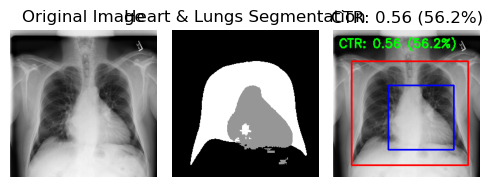

✅ Saved result for C002.png at C:\Users\DELL.COM\Desktop\Ephraim files\CTR_Results\result_C002.png
1/1 ━━━━━━━━━━━━━━━━━━━━ 5s 5s/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 6s 6s/step


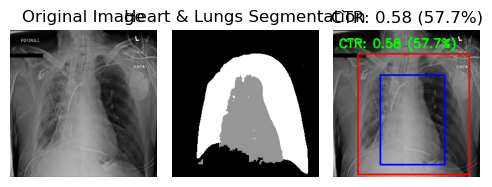

✅ Saved result for C003.png at C:\Users\DELL.COM\Desktop\Ephraim files\CTR_Results\result_C003.png
1/1 ━━━━━━━━━━━━━━━━━━━━ 5s 5s/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 6s 6s/step


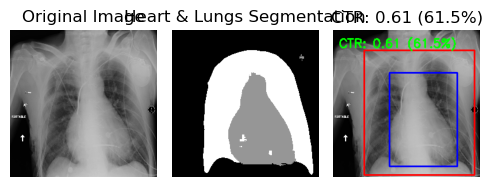

✅ Saved result for C004.png at C:\Users\DELL.COM\Desktop\Ephraim files\CTR_Results\result_C004.png
1/1 ━━━━━━━━━━━━━━━━━━━━ 5s 5s/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 6s 6s/step


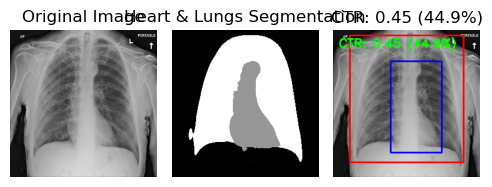

✅ Saved result for C008.png at C:\Users\DELL.COM\Desktop\Ephraim files\CTR_Results\result_C008.png
1/1 ━━━━━━━━━━━━━━━━━━━━ 5s 5s/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 6s 6s/step


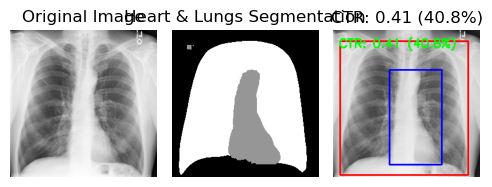

✅ Saved result for C011.png at C:\Users\DELL.COM\Desktop\Ephraim files\CTR_Results\result_C011.png
1/1 ━━━━━━━━━━━━━━━━━━━━ 9s 9s/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 7s 7s/step


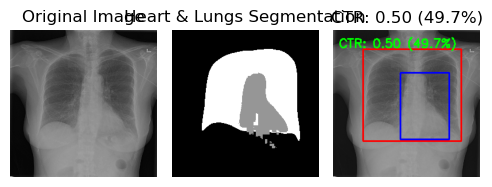

✅ Saved result for C012.png at C:\Users\DELL.COM\Desktop\Ephraim files\CTR_Results\result_C012.png
1/1 ━━━━━━━━━━━━━━━━━━━━ 4s 4s/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 6s 6s/step


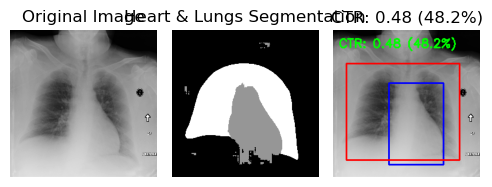

✅ Saved result for C018.png at C:\Users\DELL.COM\Desktop\Ephraim files\CTR_Results\result_C018.png
1/1 ━━━━━━━━━━━━━━━━━━━━ 4s 4s/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 6s 6s/step


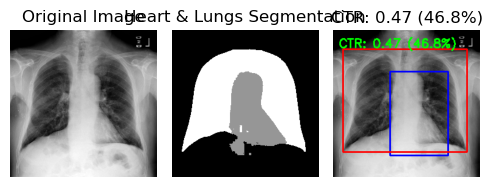

✅ Saved result for C021.png at C:\Users\DELL.COM\Desktop\Ephraim files\CTR_Results\result_C021.png
1/1 ━━━━━━━━━━━━━━━━━━━━ 4s 4s/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 6s 6s/step


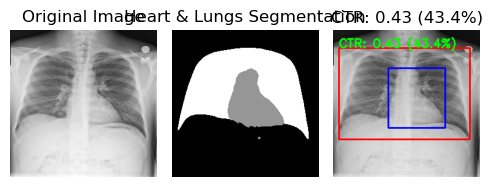

✅ Saved result for C028.png at C:\Users\DELL.COM\Desktop\Ephraim files\CTR_Results\result_C028.png
1/1 ━━━━━━━━━━━━━━━━━━━━ 4s 4s/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 5s 5s/step


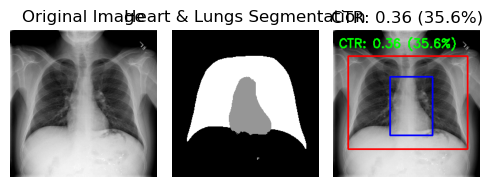

✅ Saved result for C036.png at C:\Users\DELL.COM\Desktop\Ephraim files\CTR_Results\result_C036.png
1/1 ━━━━━━━━━━━━━━━━━━━━ 4s 4s/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 5s 5s/step


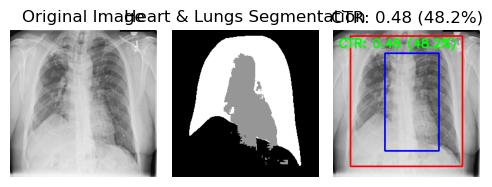

✅ Saved result for C041.png at C:\Users\DELL.COM\Desktop\Ephraim files\CTR_Results\result_C041.png
1/1 ━━━━━━━━━━━━━━━━━━━━ 4s 4s/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 5s 5s/step


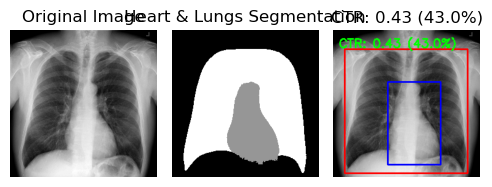

✅ Saved result for C065.png at C:\Users\DELL.COM\Desktop\Ephraim files\CTR_Results\result_C065.png
1/1 ━━━━━━━━━━━━━━━━━━━━ 4s 4s/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 6s 6s/step


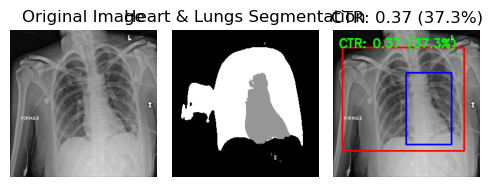

✅ Saved result for C167.png at C:\Users\DELL.COM\Desktop\Ephraim files\CTR_Results\result_C167.png
1/1 ━━━━━━━━━━━━━━━━━━━━ 5s 5s/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 6s 6s/step


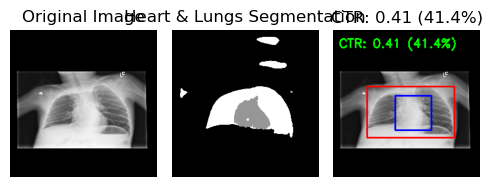

✅ Saved result for C271.png at C:\Users\DELL.COM\Desktop\Ephraim files\CTR_Results\result_C271.png
🎯 All images processed and displayed successfully!


In [18]:
import os
import numpy as np
import tensorflow as tf
import cv2
import matplotlib.pyplot as plt

# Paths to models and image directory
HEART_MODEL_PATH = r"C:\Users\DELL.COM\Desktop\Ephraim files\CTR_UNet_FineTuned.keras"
LUNGS_MODEL_PATH = r"C:\Users\DELL.COM\Desktop\Ephraim files\CTR_UNet_Luuuungs_precision.keras"
IMAGE_DIR = r"C:\Users\DELL.COM\Desktop\Ephraim files\Generated"
OUTPUT_DIR = r"C:\Users\DELL.COM\Desktop\Ephraim files\CTR_Results"

# Ensure output directory exists
os.makedirs(OUTPUT_DIR, exist_ok=True)

# Image size expected by the models
IMG_SIZE = (256, 256)

# Load models
heart_model = tf.keras.models.load_model(HEART_MODEL_PATH)
lungs_model = tf.keras.models.load_model(LUNGS_MODEL_PATH)

# Enable interactive mode for VS Code
plt.ion()

# ✅ Function to load and preprocess an image
def load_image(path):
    img = cv2.imread(path, cv2.IMREAD_GRAYSCALE)  # Load as grayscale
    if img is None:
        raise ValueError(f"Failed to load image: {path}")

    img = cv2.resize(img, IMG_SIZE)  # Resize
    img = img / 255.0  # Normalize
    img = np.expand_dims(img, axis=-1)  # (256, 256, 1)

    # ✅ Convert grayscale to 3 channels for lungs model
    img_rgb = np.concatenate([img] * 3, axis=-1)  # (256, 256, 3)

    return np.expand_dims(img, axis=0), np.expand_dims(img_rgb, axis=0)  # (1, 256, 256, 1) & (1, 256, 256, 3)

# ✅ Function to get bounding box from a binary mask
def get_bounding_box(mask):
    contours, _ = cv2.findContours(mask, cv2.RETR_EXTERNAL, cv2.CHAIN_APPROX_SIMPLE)
    if contours:
        x, y, w, h = cv2.boundingRect(max(contours, key=cv2.contourArea))  # Largest contour
        return (x, y, x + w, y + h)  # (x_min, y_min, x_max, y_max)
    return None

# ✅ Get list of images
image_files = sorted([f for f in os.listdir(IMAGE_DIR) if f.endswith(('.png', '.jpg', '.jpeg'))])

# ✅ Process and display results
for img_name in image_files:
    img_path = os.path.join(IMAGE_DIR, img_name)
    
    try:
        # ✅ Load image
        img_gray, img_rgb = load_image(img_path)

        # ✅ Predict segmentation masks
        pred_heart = heart_model.predict(img_gray)[0].squeeze()  # Heart model uses grayscale
        pred_lungs = lungs_model.predict(img_rgb)[0].squeeze()   # Lungs model expects RGB

        # ✅ Convert to binary masks (thresholding)
        threshold = 0.5
        pred_heart_binary = (pred_heart > threshold).astype(np.uint8) * 255
        pred_lungs_binary = (pred_lungs > threshold).astype(np.uint8) * 255

        # ✅ Get bounding boxes
        heart_bbox = get_bounding_box(pred_heart_binary)
        lungs_bbox = get_bounding_box(pred_lungs_binary)

        # ✅ Compute CTR ratio
        if heart_bbox and lungs_bbox:
            heart_width = heart_bbox[2] - heart_bbox[0]
            lungs_width = lungs_bbox[2] - lungs_bbox[0]
            ctr_ratio = heart_width / lungs_width
            ctr_percent = ctr_ratio * 100
        else:
            ctr_ratio, ctr_percent = 0, 0

        # ✅ Create overlay mask
        combined_mask = np.zeros_like(pred_heart_binary)
        combined_mask[pred_lungs_binary > 0] = 255  # White for lungs
        combined_mask[pred_heart_binary > 0] = 150  # Gray for heart

        # ✅ Convert original image for display
        display_img = (img_gray.squeeze() * 255).astype(np.uint8)
        img_with_boxes = cv2.cvtColor(display_img, cv2.COLOR_GRAY2BGR)

        # ✅ Draw bounding boxes
        if heart_bbox:
            cv2.rectangle(img_with_boxes, (heart_bbox[0], heart_bbox[1]), (heart_bbox[2], heart_bbox[3]), (0, 0, 255), 2)
        if lungs_bbox:
            cv2.rectangle(img_with_boxes, (lungs_bbox[0], lungs_bbox[1]), (lungs_bbox[2], lungs_bbox[3]), (255, 0, 0), 2)

        # ✅ Display CTR ratio
        cv2.putText(img_with_boxes, f"CTR: {ctr_ratio:.2f} ({ctr_percent:.1f}%)", 
                    (10, 30), cv2.FONT_HERSHEY_SIMPLEX, 0.7, (0, 255, 0), 2)

        # ✅ Plot results side by side
        fig, axes = plt.subplots(1, 3, figsize=(5, 3))

        axes[0].imshow(display_img, cmap="gray")
        axes[0].set_title("Original Image")

        axes[1].imshow(combined_mask, cmap="gray")
        axes[1].set_title("Heart & Lungs Segmentation")

        axes[2].imshow(img_with_boxes)
        axes[2].set_title(f"CTR: {ctr_ratio:.2f} ({ctr_percent:.1f}%)")

        for ax in axes:
            ax.axis("off")

        plt.tight_layout()
        plt.show()  # ✅ Ensure display in VS Code

        # ✅ Save output
        save_path = os.path.join(OUTPUT_DIR, f"result_{img_name}")
        plt.savefig(save_path, bbox_inches="tight", pad_inches=0)
        plt.close()

        print(f"✅ Saved result for {img_name} at {save_path}")

    except Exception as e:
        print(f"❌ Error processing {img_name}: {e}")

print("🎯 All images processed and displayed successfully!")
